# Name:Marco
# Surname: Galimi
# Student ID: 10706888 

In this project, we aim to use the Online Shoppers Purchasing Intention dataset to
**build a classification model** that can predict whether or not an online shopper has
the intention to make a purchase.

### Background
The Online Shoppers Purchasing Intention dataset is a publicly available dataset
that contains information on the browsing behavior and purchase history of online
shoppers. The dataset contains different sessions, and it was formed so that each
session would belong to a different user in a 1-year period to avoid any tendency to
a specific campaign, special day, user profile, or period. The dataset has been made
available on the UCI Machine Learning Repository.
### Dataset Composition
The dataset contains just over 12,000 samples and includes both categorical and
continuous variables. The categorical variables include information on the type of
the operating system, the region of the shopper, and whether or not the shopper was
a returning visitor. The continuous variables include information on the duration of
the visit, the number of pages visited, and the exit rate, among others.
We have provided you with a particular version of this dataset. There are two files
representing the training set and the test set. For the purposes of this project, we
have corrupted a significant amount of samples of the Exit Rate variable.


## Libraries

In [91]:
import numpy as np
from numpy import *
import pandas as pd
import mlxtend
from matplotlib import pyplot
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import seaborn as sns
import statsmodels.api as sm
from sklearn import preprocessing, svm, feature_selection, metrics
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, OneHotEncoder, StandardScaler
from sklearn.metrics import r2_score, mean_squared_error, accuracy_score, classification_report, precision_score, recall_score, make_scorer, jaccard_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, LassoCV, Lasso, LogisticRegression
from scipy.stats import t, f, norm, zscore
from sklearn.model_selection import RepeatedKFold, GridSearchCV, KFold, train_test_split, cross_val_score, cross_val_predict, RepeatedStratifiedKFold
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif, f_classif, SequentialFeatureSelector
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering


__Import our data, we have the complete dataset, and already done the training and the test__

In [2]:
data = train = pd.read_csv("C:/Users/Marco/Desktop/MAGISTRALE/Machine Learning/ML-2223-HW/data/online_shoppers_intention.csv")
train = pd.read_csv("C:/Users/Marco/Desktop/MAGISTRALE/Machine Learning/ML-2223-HW/data/training_set_online_shoppers_intention.csv")
test = pd.read_csv("C:/Users/Marco/Desktop/MAGISTRALE/Machine Learning/ML-2223-HW/data/test_set_online_shoppers_intention.csv")

__Visualize the dataset__

In [3]:
data.info()  
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


__Get some information on our features__

In [4]:
data.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427,2.124006,2.357097,3.147364,4.069586
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917,0.911325,1.717277,2.401591,4.025169
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157214,0.016813,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


__Count how many NaN we have in our data, this are related to the corrupted values for Exit Rates, that we will have to recover in point 1__

In [5]:
print("Train: ", train.isnull().sum())
print("Test: ", test.isnull().sum())

Train:  Unnamed: 0                    0
Administrative                0
Administrative_Duration       0
Informational                 0
Informational_Duration        0
ProductRelated                0
ProductRelated_Duration       0
BounceRates                   0
ExitRates                  2782
PageValues                    0
SpecialDay                    0
Month                         0
OperatingSystems              0
Browser                       0
Region                        0
TrafficType                   0
VisitorType                   0
Weekend                       0
Revenue                       0
dtype: int64
Test:  Unnamed: 0                   0
Administrative               0
Administrative_Duration      0
Informational                0
Informational_Duration       0
ProductRelated               0
ProductRelated_Duration      0
BounceRates                  0
ExitRates                  917
PageValues                   0
SpecialDay                   0
Month                  

_In order to use the categorical variables in some models we will create three dataframes with one-hot-encoding for all categorical variables_

In [6]:
one_hot_encoded_data = pd.get_dummies(data, columns = ["Month", "OperatingSystems", "Browser", "Region", "TrafficType", "VisitorType"])
one_hot_encoded_train = pd.get_dummies(train, columns = ["Month", "OperatingSystems", "Browser", "Region", "TrafficType", "VisitorType"])
one_hot_encoded_test = pd.get_dummies(test, columns = ["Month", "OperatingSystems", "Browser", "Region", "TrafficType", "VisitorType"])
dataframes = [one_hot_encoded_data, one_hot_encoded_train, one_hot_encoded_test, train, test, data]

__Now let's preprocess the dataset, we will check first if there are missing values and duplicated data__

_Duplicated data need to be removed because it can cause bias and affect the accuracy of the model and leads to inaccurate prediction_

In [7]:
for d in dataframes:
    d.drop_duplicates(inplace=True)

train_NaN = one_hot_encoded_train[one_hot_encoded_train['ExitRates'].isna()].reset_index(drop=True)
train_NaN.drop("ExitRates", axis=1, inplace = True)
test_NaN = one_hot_encoded_test[one_hot_encoded_train['ExitRates'].isna()].reset_index(drop=True)
test_NaN.drop("ExitRates", axis=1, inplace = True)
train_No_NaN = one_hot_encoded_train.dropna().reset_index(drop=True)
test_No_NaN = one_hot_encoded_test.dropna().reset_index(drop=True)


dataframes_NaN = [train_No_NaN, test_No_NaN, train_NaN, test_NaN]
for d in dataframes_NaN:
    d = d.drop("Unnamed: 0", axis=1, inplace = True)

C:\Users\Marco\AppData\Local\Temp\ipykernel_5964\3362483631.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  test_NaN = one_hot_encoded_test[one_hot_encoded_train['ExitRates'].isna()].reset_index(drop=True)


__We removed duplicated data and missing values, so let's see a table shows the count, mean, standard deviation, min, 25%, 50%, 75%, and max values for each column.__ 

In [8]:
train_No_NaN.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,TrafficType_14,TrafficType_15,TrafficType_16,TrafficType_17,TrafficType_18,TrafficType_19,TrafficType_20,VisitorType_New_Visitor,VisitorType_Other,VisitorType_Returning_Visitor
count,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,...,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.00000,6466.000000,6466.000000,6466.000000
mean,2.286576,78.764519,0.500309,34.265697,31.608877,1184.319193,0.021911,0.042791,5.866036,0.061274,...,0.000928,0.002474,0.000309,0.000155,0.000464,0.001237,0.01562,0.138880,0.007423,0.853696
std,3.285393,168.883876,1.243980,134.169156,43.760806,1769.932298,0.047998,0.048164,18.574180,0.198339,...,0.030450,0.049686,0.017586,0.012436,0.021537,0.035155,0.12401,0.345848,0.085846,0.353438
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,183.412500,0.000000,0.014286,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000
50%,1.000000,7.000000,0.000000,0.000000,18.000000,594.358333,0.003125,0.025000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000
75%,4.000000,89.995000,0.000000,0.000000,37.000000,1470.523958,0.016667,0.050000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000
max,27.000000,2720.500000,12.000000,2195.300000,584.000000,24844.156200,0.200000,0.200000,361.763742,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000


__Look for outliers and distribution of variables by using density graph and boxplots__

In [9]:
num_cols = [x for x in data.select_dtypes(include=np.number)]
cat_cols = [x for x in data.select_dtypes(exclude=np.number)]

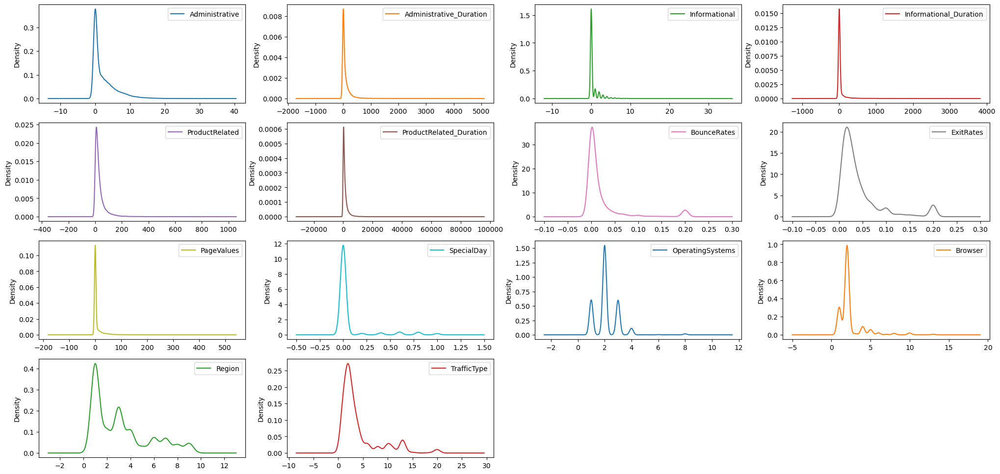

In [10]:
data[num_cols].plot(kind='density', subplots=True, layout=(4,4), sharex=False, figsize=(25, 12));

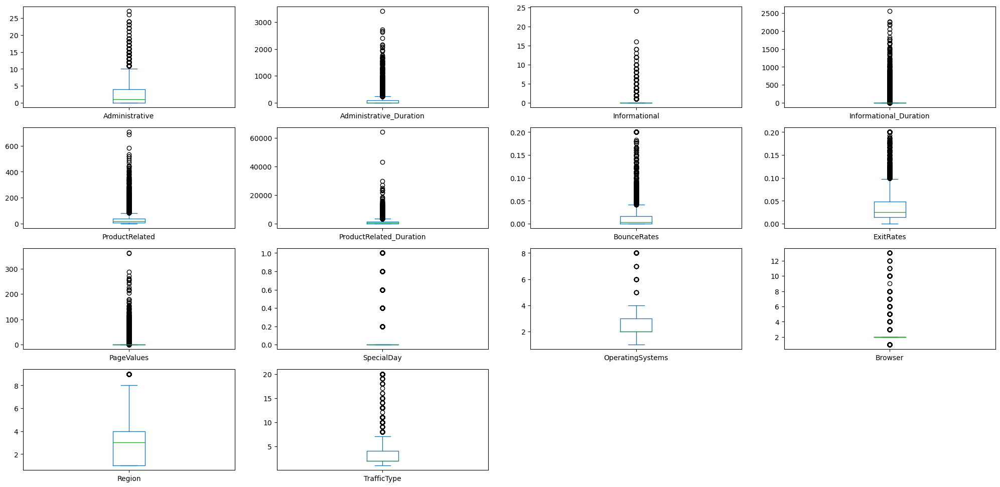

In [11]:
data[num_cols].plot(kind='box', subplots=True, layout=(4,4), sharex=False, figsize=(25, 12));

_From the above boxplot, we can clearly see that all most every column has some amounts of outliers._
_But we will not drop it right now, because maybe they are related to some categorical variables, like month or weekend_

__Now let's look at correlation!__

In [12]:
# Calcola la correlazione
corr = train_No_NaN.corr()

# Imposta la dimensione della figura e la risoluzione
plt.figure(figsize=(40, 30), dpi=500)

# Crea la heatmap con annotazioni e specifica il formato dei valori
sns.heatmap(corr, annot=True, fmt='.2f')

# Mostra la heatmap
plt.show()

In [13]:
corr['Revenue'].sort_values(ascending = False)

Revenue                          1.000000
PageValues                       0.476032
ProductRelated_Duration          0.154789
Month_Nov                        0.149875
ProductRelated                   0.148754
                                   ...   
TrafficType_3                   -0.086033
SpecialDay                      -0.089017
VisitorType_Returning_Visitor   -0.108985
BounceRates                     -0.151476
ExitRates                       -0.208109
Name: Revenue, Length: 74, dtype: float64

In [14]:
# Lista delle colonne da eliminare
columns_to_drop = ["Browser_1", "OperatingSystem_1", "Browser_13", "OperatingSystem_8"]

for d in dataframes_NaN:
    # Controlla se la colonna è presente nel DataFrame prima di eseguire il drop
    for col in columns_to_drop:
        if col in d.columns:
            d.drop(col, axis=1, inplace=True)

_The correlated variables for a significant value are ProductRelated and ProductRelated_Duration, and this is obvious since are different measures for the product related pages, and Exit Rate with Bounce Rate, and this is good because for the firs point we have a high correlated variable with the one that we want to recover._ 

### Exploratory Data Analysis

__Our target variable is "Revenue"; we will se how this variable is distributed among the different classes in our dataset__

  Month  Total Revenue
0   Aug             76
1   Dec            216
2   Feb              3
3   Jul             66
4  June             29
5   Mar            192
6   May            365
7   Nov            760
8   Oct            115
9   Sep             86


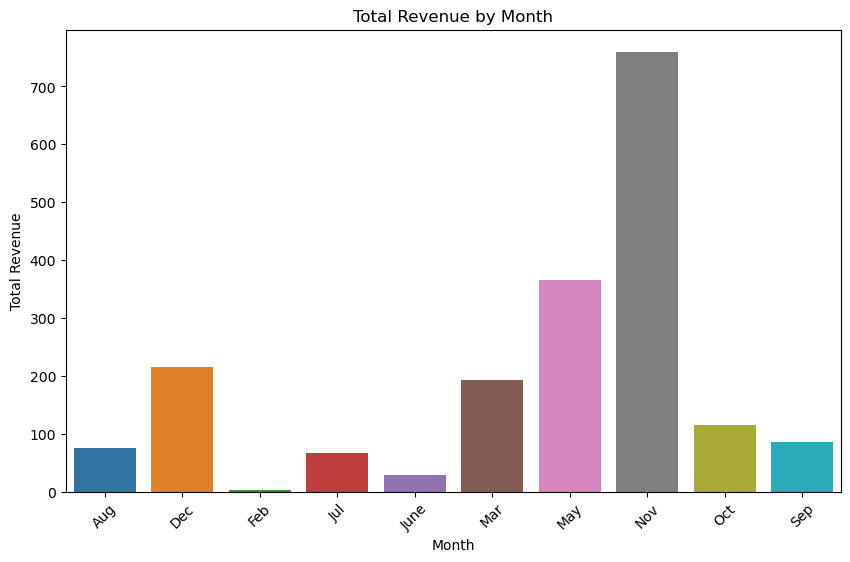

In [15]:
grouped_data = data.groupby('Month')
total_revenue = grouped_data['Revenue'].sum()

# Compare revenue across traffic types
revenue_comparison = pd.DataFrame({'Total Revenue': total_revenue}).reset_index()
print(revenue_comparison)

# Visualize the data
plt.figure(figsize=(10, 6))
sns.barplot(data=revenue_comparison, x='Month', y='Total Revenue')
plt.title('Total Revenue by Month')
plt.xlabel('Month')
plt.ylabel('Total Revenue')
plt.xticks(rotation=45)
plt.show()

   Region  Total Revenue
0       1            771
1       2            188
2       3            349
3       4            175
4       5             52
5       6            112
6       7            119
7       8             56
8       9             86


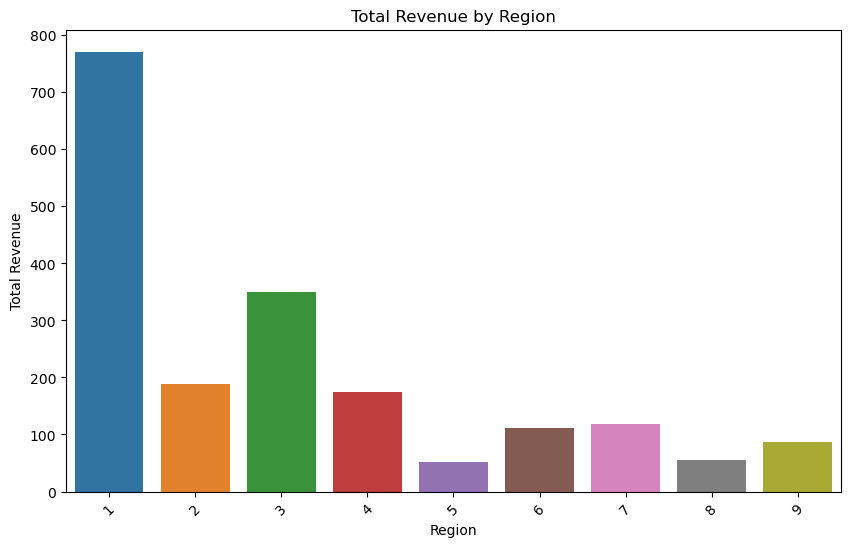

In [16]:
grouped_data = data.groupby('Region')
total_revenue = grouped_data['Revenue'].sum()

# Compare revenue across traffic types
revenue_comparison = pd.DataFrame({'Total Revenue': total_revenue}).reset_index()
print(revenue_comparison)


# Visualize the data
plt.figure(figsize=(10, 6))
sns.barplot(data=revenue_comparison, x='Region', y='Total Revenue')
plt.title('Total Revenue by Region')
plt.xlabel('Region')
plt.ylabel('Total Revenue')
plt.xticks(rotation=45)
plt.show()

   Weekend  Total Revenue
0    False           1409
1     True            499


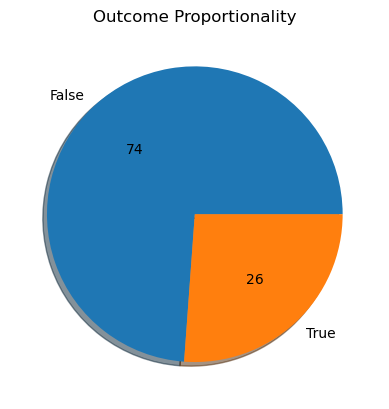

In [17]:
grouped_data = data.groupby('Weekend')
total_revenue = grouped_data['Revenue'].sum()

# Compare revenue across traffic types
revenue_comparison = pd.DataFrame({'Total Revenue': total_revenue}).reset_index()
print(revenue_comparison)


# Visualize the data
plt.pie(revenue_comparison["Total Revenue"],
        labels= revenue_comparison["Weekend"],
        autopct='%.f', shadow=True)
plt.title('Outcome Proportionality')
plt.show()

         VisitorType  Total Revenue
0        New_Visitor            422
1              Other             16
2  Returning_Visitor           1470


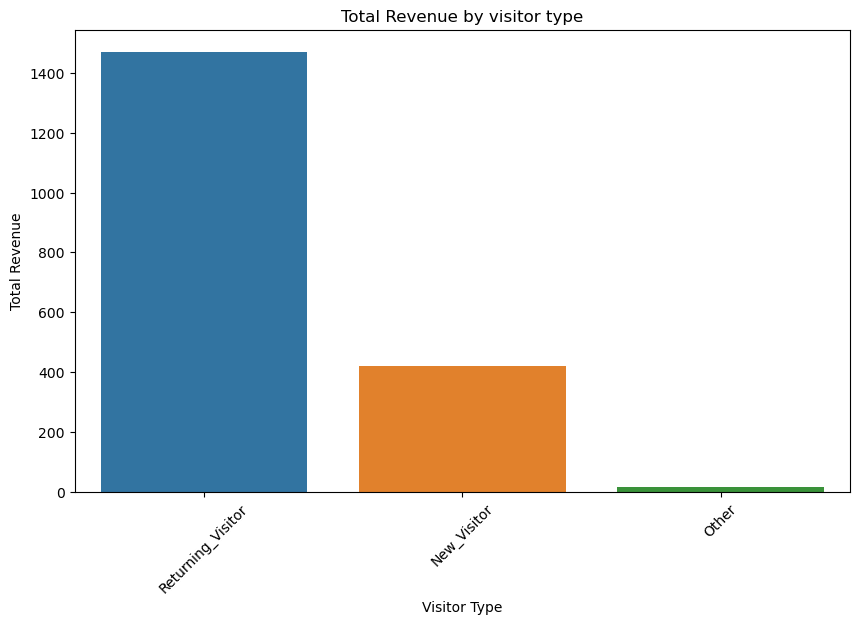

In [18]:
grouped_data = data.groupby('VisitorType')
total_revenue = grouped_data['Revenue'].sum()

# Compare revenue across traffic types
revenue_comparison = pd.DataFrame({'Total Revenue': total_revenue}).reset_index()
print(revenue_comparison)

# Sort the revenue comparison dataframe in descending order based on the revenue metric
revenue_comparison.sort_values(by='Total Revenue', ascending=False, inplace=True)

# Visualize the data
plt.figure(figsize=(10, 6))
sns.barplot(data=revenue_comparison, x='VisitorType', y='Total Revenue')
plt.title('Total Revenue by visitor type')
plt.xlabel('Visitor Type')
plt.ylabel('Total Revenue')
plt.xticks(rotation=45)
plt.show()

    TrafficType  Total Revenue
0             1            262
1             2            847
2             3            180
3             4            165
4             5             56
5             6             53
6             7             12
7             8             95
8             9              4
9            10             90
10           11             47
11           12              0
12           13             43
13           14              2
14           15              0
15           16              1
16           17              0
17           18              0
18           19              1
19           20             50


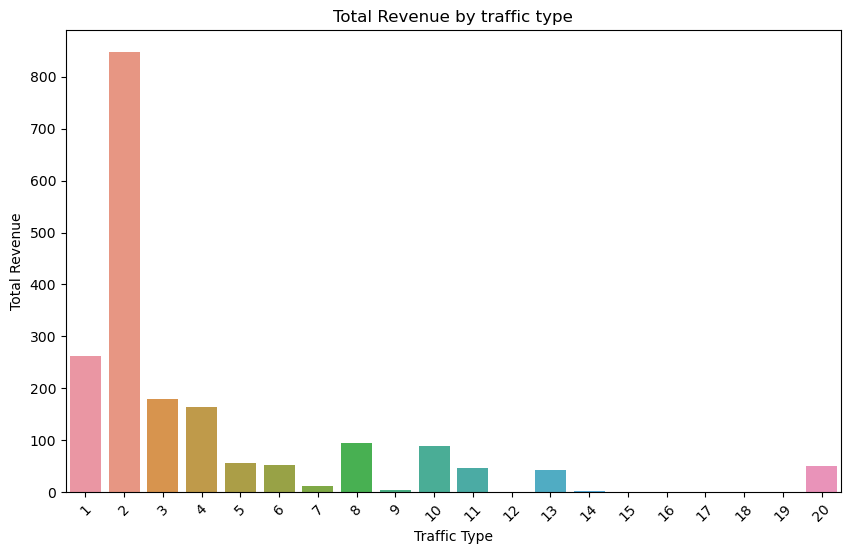

In [19]:
grouped_data = data.groupby('TrafficType')
total_revenue = grouped_data['Revenue'].sum()

# Compare revenue across traffic types
revenue_comparison = pd.DataFrame({'Total Revenue': total_revenue}).reset_index()
print(revenue_comparison)


# Visualize the data
plt.figure(figsize=(10, 6))
sns.barplot(data=revenue_comparison, x='TrafficType', y='Total Revenue')
plt.title('Total Revenue by traffic type')
plt.xlabel('Traffic Type')
plt.ylabel('Total Revenue')
plt.xticks(rotation=45)
plt.show()

_We can drop from our data low frequency traffic type_

In [20]:
# Lista delle colonne da eliminare
columns_to_drop = [
    "TrafficType_7", "TrafficType_9", "TrafficType_14", "TrafficType_15",
    "TrafficType_16", "TrafficType_18", "TrafficType_19", "TrafficType_17", "TrafficType_12"
]

# Esegui il drop per ciascun DataFrame
for d in dataframes_NaN:
    for col in columns_to_drop:
        if col in d.columns:
            d.drop(col, axis=1, inplace=True)

    Browser  Total Revenue
0         1            365
1         2           1223
2         3              5
3         4            130
4         5             86
5         6             20
6         7              6
7         8             21
8         9              0
9        10             32
10       11              1
11       12              3
12       13             16


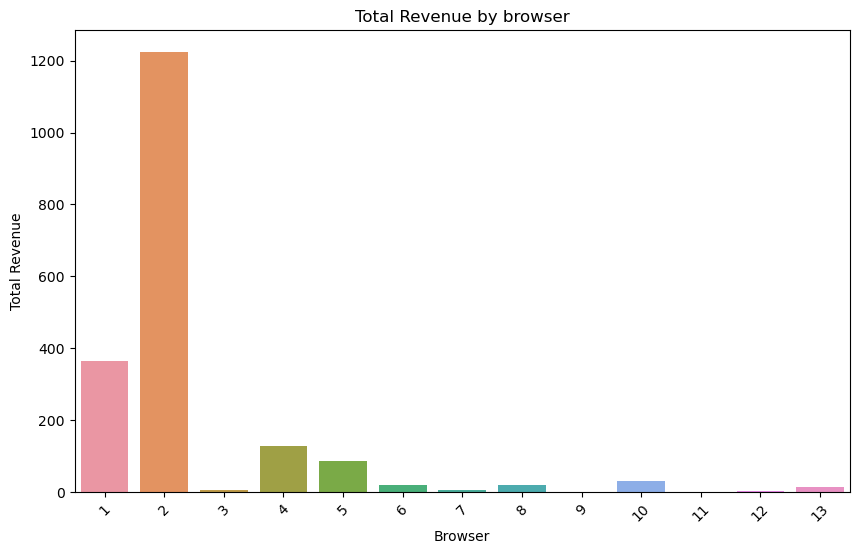

In [21]:
grouped_data = data.groupby('Browser')
total_revenue = grouped_data['Revenue'].sum()

# Compare revenue across traffic types
revenue_comparison = pd.DataFrame({'Total Revenue': total_revenue}).reset_index()
print(revenue_comparison)


# Visualize the data
plt.figure(figsize=(10, 6))
sns.barplot(data=revenue_comparison, x='Browser', y='Total Revenue')
plt.title('Total Revenue by browser')
plt.xlabel('Browser')
plt.ylabel('Total Revenue')
plt.xticks(rotation=45)
plt.show()

_We can drop from our data low frequency browser_

In [22]:
for d in dataframes_NaN:
    d.drop("Browser_3", axis=1, inplace = True)
    d.drop("Browser_7", axis=1, inplace = True)
    d.drop("Browser_11", axis=1, inplace = True)
    d.drop("Browser_12", axis=1, inplace = True)
test_No_NaN.drop("Browser_9", axis=1, inplace = True)
test_NaN.drop("Browser_9", axis=1, inplace = True)

   OperatingSystems  Total Revenue
0                 1            379
1                 2           1155
2                 3            268
3                 4             85
4                 5              1
5                 6              2
6                 7              1
7                 8             17


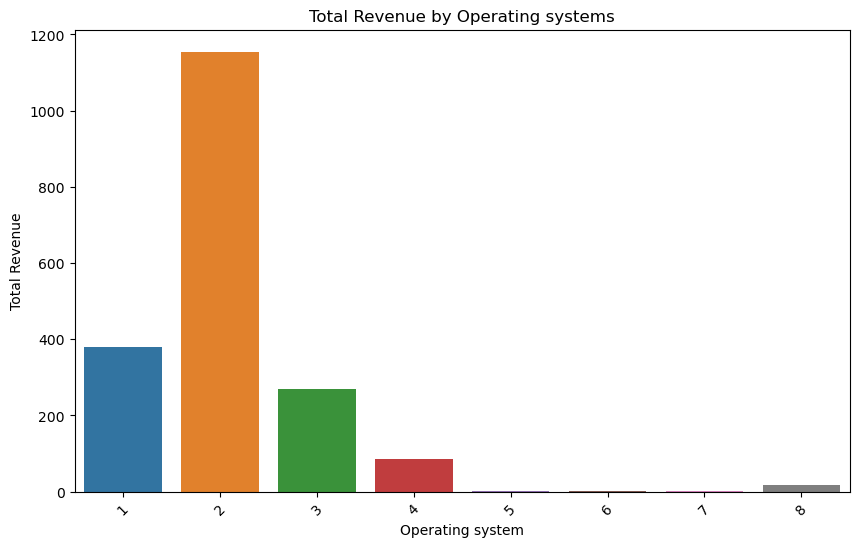

In [23]:
grouped_data = data.groupby('OperatingSystems')
total_revenue = grouped_data['Revenue'].sum()

# Compare revenue across traffic types
revenue_comparison = pd.DataFrame({'Total Revenue': total_revenue}).reset_index()
print(revenue_comparison)


# Visualize the data
plt.figure(figsize=(10, 6))
sns.barplot(data=revenue_comparison, x='OperatingSystems', y='Total Revenue')
plt.title('Total Revenue by Operating systems')
plt.xlabel('Operating system')
plt.ylabel('Total Revenue')
plt.xticks(rotation=45)
plt.show()

_We can drop from our data low frequency operating system_

In [24]:
for d in dataframes_NaN:
    d.drop("OperatingSystems_5", axis=1, inplace = True)
    d.drop("OperatingSystems_6", axis=1, inplace = True)
    d.drop("OperatingSystems_7", axis=1, inplace = True)

### Regression on exit rate variable

__Now we will recover the value of the Exit Rate variable, since it's a continuous variable, what we will do is fitting a linear regression, but, we know that not all the predictors will be useful to the construction of the model, so we will go through feature selection in order to build a model with only the most useful predictors__

_For this task we will use the sklearn library, and we will not split into train and test but use only the train set because this feature is also missing in the test set_

_First of all we have to encode in a different way all the categorical variables in order to use them with sklearn, a lot of variable have been already encoded thanks to the one hot encoding_

In [25]:
categorical_columns = ["Revenue", "Weekend"]
# Make the encoder
encoder = LabelEncoder()

# Fit and transform the encoder with columns from the combined data if they are not numeric
for d in dataframes:
    for col in categorical_columns:
        d[col] = d[col].astype(str)
        d[col] = d[col].str.strip()
        if not d[col].dtype.kind in 'biufc':  # Check if the column is non-numeric
            encoder.fit(d[col])
        d[col] = encoder.transform(d[col])

for d in dataframes_NaN:
    for col in categorical_columns:
        d[col] = d[col].astype(str)
        d[col] = d[col].str.strip()
        if not d[col].dtype.kind in 'biufc':  # Check if the column is non-numeric
            encoder.fit(d[col])
        d[col] = encoder.transform(d[col])


__After we have encoded in the right way our data we can train different models to predict the Exit Rate value. We will start with a Multivariate Regression with all predictors__

In [26]:
# creating feature variables
X = train_No_NaN.drop('ExitRates',axis=1)
X_Feature = list(X)
Y = train_No_NaN['ExitRates']

In [27]:
list_numerical = X.columns
list_numerical = list_numerical[:9]
list_numerical

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'PageValues', 'SpecialDay'],
      dtype='object')

__We scale our data, this is important because we will use feature selection methods like LASSO and Ridge, after the scaling we divide in train and test. I will not use the scaled data for the multivariate linear regression, because it's not required__

In [28]:
scaler = StandardScaler().fit(X[list_numerical]) 

X[list_numerical] = scaler.transform(X[list_numerical])

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)

## Linear Regression

Linear Regression is a fundamental and widely used statistical technique for modeling the relationship between a dependent variable (target) and one or more independent variables (features). The primary goal of linear regression is to find the best-fitting straight line that represents the linear relationship between the input variables and the output.

In simple linear regression, there is only one independent variable, and the relationship is represented by a straight line equation: y = mx + b. Here, 'y' is the dependent variable (target), 'x' is the independent variable (feature), 'm' is the slope or coefficient of the feature, and 'b' is the intercept. The line's slope (m) represents the change in the target variable for a unit change in the feature variable, while the intercept (b) is the value of the target when the feature is zero.

In multiple linear regression, there are multiple independent variables, and the relationship can be expressed as y = b0 + b1*x1 + b2*x2 + ... + bn*xn. Here, 'y' is the dependent variable (target), 'x1', 'x2', ..., 'xn' are the independent variables (features), and 'b0', 'b1', 'b2', ..., 'bn' are the coefficients associated with each feature.

The process of fitting a linear regression model involves estimating the coefficients that minimize the difference between the predicted values and the actual target values, typically using the method of least squares. Once the model is fitted, it can be used to make predictions for new data points based on their feature values.

Linear regression is widely used for tasks such as predicting numerical values, estimating relationships between variables, and understanding the impact of different features on the target variable. However, it assumes a linear relationship between the variables and may not be suitable for datasets with complex nonlinear patterns.

Overall, Linear Regression is a powerful and interpretable technique that serves as a foundation for more advanced regression and machine learning models.

## R-squared (R^2) Metric

R-squared, denoted as R^2, is a statistical metric used to evaluate the goodness of fit of a regression model. It provides a measure of how well the model explains the variability in the dependent variable (target) based on the independent variables (features).

The R^2 value ranges from 0 to 1, where:
- R^2 = 0 indicates that the model explains none of the variability in the target variable. The predicted values are no better than simply using the mean of the target.
- R^2 = 1 indicates that the model perfectly fits the data, and all the variability in the target is explained by the independent variables. In practice, achieving an R^2 value of 1 is rare.

An R^2 value between 0 and 1 indicates the proportion of the target's variance that is captured by the model. A higher R^2 value suggests a better fit, indicating that the model explains a larger portion of the target's variability.

However, it is essential to interpret R^2 carefully. A high R^2 does not necessarily imply that the model is good or that it has predictive power. A model may have a high R^2 but still be biased or overfit to the training data, resulting in poor performance on unseen data.

R^2 is a valuable metric when comparing different models or assessing the improvement of a model after feature engineering or hyperparameter tuning. However, it is just one aspect of model evaluation, and it is essential to consider other metrics and perform proper validation to assess a model's overall performance and generalization ability.

In summary, R-squared (R^2) is a metric that quantifies the proportion of the variance in the target variable that is explained by the regression model. It provides a quick indication of the model's fit but should be used in conjunction with other evaluation metrics to draw comprehensive conclusions about the model's effectiveness.



__Let's build a full Linear Regression__
__We will use as score metric for this point and to evaluate this and the other regression models the R^2 metric__

In [29]:
# creating a regression model
model = LinearRegression(fit_intercept=True)
# fitting the model
model.fit(X_train, y_train)
# making predictions
predictions_train = model.predict(X_train)
predictions_test = model.predict(X_test)

print("The intercept is {:0.3f}".format(model.intercept_))
for idx, col_name in enumerate(X_Feature):
    print("The coefficient for {} is {:0.3f}".format(col_name, model.coef_[idx]))
    
print("R2 score ", r2_score(y_test, predictions_test))

The intercept is 3698391102.082
The coefficient for Administrative is -0.003
The coefficient for Administrative_Duration is -0.000
The coefficient for Informational is -0.000
The coefficient for Informational_Duration is 0.000
The coefficient for ProductRelated is -0.005
The coefficient for ProductRelated_Duration is 0.001
The coefficient for BounceRates is 0.041
The coefficient for PageValues is -0.002
The coefficient for SpecialDay is 0.001
The coefficient for Weekend is -0.001
The coefficient for Revenue is -0.004
The coefficient for Month_Aug is -1861820258.738
The coefficient for Month_Dec is -1861820258.737
The coefficient for Month_Feb is -1861820258.736
The coefficient for Month_Jul is -1861820258.737
The coefficient for Month_June is -1861820258.732
The coefficient for Month_Mar is -1861820258.738
The coefficient for Month_May is -1861820258.738
The coefficient for Month_Nov is -1861820258.738
The coefficient for Month_Oct is -1861820258.739
The coefficient for Month_Sep is -1

The R^2 seems good but as we look at the __coefficients__ they don't make a lot of sense, so even if the R^2 seems good we __cannot take this model as a good predictive model__, for the complexity and for the coefficients.

In order to reduce complexity we will do some feature selection, and we will go through different __feature selection__ methods

The first one is the __best subset selection__

# Forward regression

## Explanation of the code:

1. The function `forward_regression` takes several arguments:
   - `X`: The predictor variables (features) as a pandas DataFrame.
   - `y`: The target variable (dependent variable) as a pandas Series.
   - `initial_list`: A list of feature names to be considered initially (optional, defaults to an empty list).
   - `threshold_in`: The significance level to add a feature to the model (default is 0.01, meaning p-value < 0.01).
   - `threshold_out`: The significance level to remove a feature from the model (default is 0.05, meaning p-value > 0.05).
   - `verbose`: A boolean flag to control the output of the function (default is `True`).

2. Inside the function, it creates a list `included` that initially contains the features specified in the `initial_list`.

3. The function enters a loop (`while True`) that iteratively performs the forward stepwise selection. The loop continues until no more significant features can be added to the model.

4. In each iteration, the function calculates the p-value for each feature not already included in the model. It does this by fitting an Ordinary Least Squares (OLS) linear regression model with the current set of included features plus one of the excluded features. The p-value measures the significance of the added feature in the presence of the other included features.

5. If any of the p-values for the excluded features is less than the `threshold_in`, the best (most significant) feature is selected (i.e., the one with the smallest p-value) and added to the `included` list. The `changed` flag is set to `True` to indicate that the model was updated in this iteration. The name of the selected feature and its p-value are printed if `verbose=True`.

6. If no feature satisfies the condition of having a p-value less than `threshold_in`, the loop breaks, and the feature selection process is complete.

7. Finally, the function returns the list of included features.

8. An example of how to use the function is provided at the end. It calls `forward_regression` on the training data `X_train` and `y_train` and prints the selected features.

The forward stepwise feature selection is a common technique used to identify a subset of relevant features that contribute the most to the predictive power of a model. It helps to prevent overfitting and improves the interpretability of the model by selecting only the most important predictors.


In [30]:
def forward_regression(X, y,
                       initial_list=None,
                       threshold_in=0.01,
                       threshold_out=0.01,
                       verbose=True):
    if initial_list is None:
        initial_list = []

    included = list(initial_list)
    while True:
        changed = False
        # forward step
        excluded = list(set(X.columns) - set(included))
        new_pval = pd.Series(index=excluded, dtype='float64')  # Explicitly set dtype to 'float64'
        for new_column in excluded:
            model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included + [new_column]]))).fit()
            new_pval[new_column] = model.pvalues[new_column]
        best_pval = new_pval.min()
        if best_pval < threshold_in:
            best_feature = new_pval.idxmin()
            included.append(best_feature)
            changed = True
            #if verbose:
                #print(f'Add {best_feature} with p-value {best_pval}')
        if not changed:
            break

    return included

# Usage example
included_features = forward_regression(X_train, y_train)
print("Selected features:\n {}\n".format(included_features))

X_train_selected = X_train[included_features]
X_test_selected = X_test[included_features]
X_train_selected = sm.add_constant(X_train_selected)
X_test_selected = sm.add_constant(X_test_selected)

model_forward = sm.OLS(y_train, X_train_selected).fit()
print(model_forward.summary())
predictions_forward = model_forward.predict(X_test_selected)

Selected features:
 ['BounceRates', 'Administrative', 'ProductRelated', 'VisitorType_New_Visitor', 'PageValues', 'TrafficType_2', 'OperatingSystems_2', 'TrafficType_4', 'Revenue', 'SpecialDay', 'Month_June', 'OperatingSystems_3']

                            OLS Regression Results                            
Dep. Variable:              ExitRates   R-squared:                       0.867
Model:                            OLS   Adj. R-squared:                  0.867
Method:                 Least Squares   F-statistic:                     2451.
Date:                Sat, 29 Jul 2023   Prob (F-statistic):               0.00
Time:                        17:54:05   Log-Likelihood:                 11896.
No. Observations:                4526   AIC:                        -2.377e+04
Df Residuals:                    4513   BIC:                        -2.368e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                     

_For this step I will not use sklearn but statsmodel, just for the graphical output of the linear regression, the results are the same._

# Backward regression


## Explanation:

1. The function starts by determining the initial list of features to include in the model (`included` list). If no `initial_list` is provided, all columns of the predictor DataFrame `X` are included in the initial list.

2. The function enters a loop (`while True`) that iteratively performs the backward stepwise selection. The loop continues until no more features can be removed from the model.

3. In each iteration, the function fits an Ordinary Least Squares (OLS) linear regression model using the features in the current `included` list. It calculates the p-values for each feature (except the intercept term) using the fitted model.

4. The function identifies the feature with the highest p-value (`worst_pval`) among the included features. If this p-value is greater than the `threshold_in`, indicating that the feature is not statistically significant, the feature is removed from the `included` list. The `changed` flag is set to `True` to indicate that the model was updated in this iteration. The name of the removed feature and its p-value are printed if `verbose=True`.

5. If no feature satisfies the condition of having a p-value greater than `threshold_in`, meaning all included features are statistically significant, the loop breaks, and the feature selection process is complete.

6. Finally, the function returns the list of remaining included features after the backward stepwise selection.

## Usage Example:
- The function is used to perform backward stepwise feature selection on the training data `X_train` and `y_train`.
- The selected features are stored in the variable `included_features_backward`.
- The function prints the list of selected features.


In [31]:
def backward_regression(X, y,
                        initial_list=None,
                        threshold_in=0.01,
                        threshold_out=0.01,
                        verbose=True):
    if initial_list is None:
        included = list(X.columns)
    else:
        included = list(initial_list)

    while True:
        changed = False
        model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included]))).fit()
        # use all coefs except intercept
        pvalues = model.pvalues.iloc[1:]
        worst_pval = pvalues.max()  # null if pvalues is empty
        if worst_pval > threshold_in:
            changed = True
            worst_feature = pvalues.idxmax()
            included.remove(worst_feature)
            #if verbose:
                #print(f'Drop {worst_feature} with p-value {worst_pval}')
        if not changed:
            break

    return included

included_features_backward = backward_regression(X_train, y_train)
print("Selected features (backward):\n{}\n".format(included_features_backward))

X_train_selected2 = X_train[included_features_backward]
X_test_selected2 = X_test[included_features_backward]
X_train_selected2 = sm.add_constant(X_train_selected2)
X_test_selected2 = sm.add_constant(X_test_selected2)
model_back = sm.OLS(y_train, X_train_selected2).fit()
print(model_back.summary())
predictions_back = model_back.predict(X_test_selected2)


Selected features (backward):
['Administrative', 'ProductRelated', 'BounceRates', 'PageValues', 'SpecialDay', 'Revenue', 'OperatingSystems_1', 'OperatingSystems_2', 'TrafficType_1', 'TrafficType_3', 'TrafficType_13', 'VisitorType_Other', 'VisitorType_Returning_Visitor']

                            OLS Regression Results                            
Dep. Variable:              ExitRates   R-squared:                       0.867
Model:                            OLS   Adj. R-squared:                  0.866
Method:                 Least Squares   F-statistic:                     2257.
Date:                Sat, 29 Jul 2023   Prob (F-statistic):               0.00
Time:                        17:54:06   Log-Likelihood:                 11891.
No. Observations:                4526   AIC:                        -2.375e+04
Df Residuals:                    4512   BIC:                        -2.366e+04
Df Model:                          13                                         
Covariance Type: 

The forward and backward feature selection reduced by a lot the number of variables used, but we can use other methods that doesn't have the main cons of this techniques, wich are: 

So, in order to avoid this, now we will try to do a __LASSO__ and __RIDGE__ regression

# LASSO and RIDGE regression

## LASSO (Least Absolute Shrinkage and Selection Operator):

LASSO is a linear regression technique that performs both regularization and feature selection simultaneously. It adds a penalty term to the ordinary least squares cost function, constraining the absolute sum of the coefficients. This penalty encourages the model to shrink less important coefficients to exactly zero, effectively excluding those features from the model. LASSO is particularly useful for high-dimensional datasets with many features, as it helps to identify and focus on the most relevant predictors, leading to simpler and more interpretable models.

## Ridge Regression:

Ridge regression is another linear regression technique that introduces a regularization term to the ordinary least squares cost function. It adds a penalty proportional to the squared sum of the coefficients, encouraging the model to shrink their magnitudes. Unlike LASSO, Ridge regression rarely sets coefficients to exactly zero, making it less suitable for feature selection. Instead, it helps to reduce the impact of multicollinearity among predictors, stabilizing the estimates and preventing overfitting in situations where features are highly correlated. Ridge regression is particularly beneficial when dealing with datasets with multicollinearity or when all predictors are considered relevant and should be retained in the model.

In summary, both LASSO and Ridge regression are regularization techniques that mitigate overfitting in linear regression models. LASSO is more suitable for feature selection, while Ridge regression is more useful for addressing multicollinearity issues and retaining all predictors in the model. The choice between the two techniques depends on the specific characteristics of the dataset and the goal of the regression analysis.

For the lasso and Ridge we have to find the value of the penalization term (alpha). In order to select a resonable and good alpha, we will use cross validation in order to find the best alpha to fit our model!

# Lasso with 5-fold Cross-Validation

## Code Explanation:

1. The code initializes a LassoCV model (`model`) with 5-fold cross-validation (`cv=5`) and a random state (`random_state=0`) to ensure reproducibility. The parameter `max_iter` is set to 10000, which determines the maximum number of iterations for the optimization solver to converge. 

2. The model is then fitted to the training data (`X_train` and `y_train`) using the `fit` method.

3. The variable `shrink` is initialized to zero. It will be used to count the number of coefficients that are shrunk to zero by Lasso regularization.

4. The code prints the best alpha value found by the LassoCV model, which represents the regularization strength that achieved the best cross-validated performance.

5. Next, the code iterates through each feature name in `X_Feature` (assuming this is a list containing the names of the features).

6. For each feature, the code prints its corresponding coefficient value obtained from the Lasso regression (`model.coef_`). If the coefficient is exactly zero, it means that the feature has been shrunk to zero and effectively excluded from the model. The count of such coefficients is stored in the `shrink` variable.

7. After analyzing the coefficients, the code initializes a new Lasso model (`lasso_best`) with the best alpha value found during cross-validation.

8. The new Lasso model (`lasso_best`) is then fitted to the training data (`X_train` and `y_train`) again.

9. The code performs 5-fold cross-validation using `cross_val_score` to evaluate the Lasso model's performance. It calculates the mean squared error (MSE) and R-squared (`R^2`) scores for each fold.

10. The code prints the average MSE and R-squared scores along with their standard deviations based on the cross-validation results.

11. Finally, the code prints the R-squared score on the training set (`R squared training set`) and the R-squared score on the test set (`R squared test set`) to evaluate the model's performance on both training and test data.

The Lasso regression model is a linear regression technique that performs L1 regularization, which allows it to automatically perform feature selection by shrinking less important features to zero. The 5-fold cross-validation helps to assess the model's generalization performance and identify the best regularization strength (alpha) that provides the most optimal trade-off between bias and variance.


In [32]:
# Lasso with 5 fold cross-validation
model = LassoCV(cv=5, random_state=0, max_iter=10000)

# Fit model
model.fit(X_train, y_train)

shrink = 0
print("The best alpha for our model is {} \n".format(model.alpha_))
for idx, col_name in enumerate(X_Feature):
    #print("The coefficient for {} is {}".format(col_name, model.coef_[idx]))
    if model.coef_[idx] == 0:
        shrink += 1
print("\nThanks to LASSO {} coefficients have been shrinked\n".format(shrink))

lasso_best = Lasso(alpha=model.alpha_)
lasso_best.fit(X_train, y_train)

scores = cross_val_score(lasso_best, X, Y, cv=5, scoring='r2')
scores2 = cross_val_score(lasso_best, X, Y, cv=5, scoring='neg_mean_squared_error')
print("%f MSE with a standard deviation of %f\n" % (-scores2.mean(), scores2.std()))
print("%f R^2 with a standard deviation of %f\n" % (scores.mean(), scores.std()))
print('R squared training set\n', (lasso_best.score(X_train, y_train)))
print('R squared test set\n', (lasso_best.score(X_test, y_test)))

The best alpha for our model is 6.194173004033821e-05 


Thanks to LASSO 30 coefficients have been shrinked

0.000320 MSE with a standard deviation of 0.000045

0.861202 R^2 with a standard deviation of 0.015174

R squared training set
 0.8674710310201281
R squared test set
 0.8524654289347195


# Ridge with 5-fold Cross-Validation

## Code Explanation:

1. The code initializes a RidgeCV model (`model2`) with 5-fold cross-validation (`cv=5`). The RidgeCV model performs cross-validation to automatically find the best regularization parameter (`alpha`) using Ridge regression.

2. The model is then fitted to the training data (`X_train` and `y_train`) using the `fit` method.

3. The variable `shrink` is initialized to zero. It will be used to count the number of coefficients that have been shrunk to values close to zero by Ridge regularization.

4. The code prints the best alpha value found by the RidgeCV model. The best alpha represents the regularization strength that achieved the best cross-validated performance.

5. Next, the code iterates through each feature name in `X_Feature` (assuming this is a list containing the names of the features).

6. For each feature, the code checks if its absolute value of the coefficient (`model2.coef_[idx]`) is less than or equal to 0.001. If it is, this means the coefficient has been shrunk to a value close to zero.

7. If a coefficient meets the condition, the `shrink` variable is incremented by one.

8. After analyzing the coefficients, the code initializes a new Ridge model (`ridge_best`) with the best alpha value found during cross-validation.

9. The new Ridge model (`ridge_best`) is then fitted to the training data (`X_train` and `y_train`) again.

10. The code performs 5-fold cross-validation using `cross_val_score` to evaluate the Ridge model's performance. It calculates the mean R-squared (`R^2`) score for each fold.

11. The code prints the average R-squared score along with its standard deviation based on the cross-validation results.

12. Lastly, the code performs 5-fold cross-validation again to evaluate the Ridge model's mean squared error (`MSE`). It prints the average MSE and its standard deviation based on the cross-validation results.

The Ridge regression model is a linear regression technique that performs L2 regularization, which helps prevent overfitting by penalizing large coefficients. It is particularly useful when dealing with multicollinearity among predictors. The 5-fold cross-validation provides an estimate of the model's generalization performance on unseen data, and the metrics printed give insight into how well the Ridge model fits the data.


In [33]:
# ridge with 5 fold cross-validation
model2 = RidgeCV(cv=5)

# Fit model
model2.fit(X_train, y_train)
shrink = 0
print(model2.alpha_)
for idx, col_name in enumerate(X_Feature):
    #print("The coefficient for {} is {}".format(col_name, model2.coef_[idx]))
    if abs(model2.coef_[idx]) <= 0.001:
        shrink += 1
print("Thanks to RIDGE {} coefficients have been shrinked\n".format(shrink))

ridge_best = Ridge(alpha=model2.alpha_)
ridge_best.fit(X_train, y_train)

scores = cross_val_score(ridge_best, X, Y, cv=5, scoring='r2')
print("%f R^2 with a standard deviation of %f\n" % (scores.mean(), scores.std()))
scores = cross_val_score(ridge_best, X, Y, cv=5, scoring='neg_mean_squared_error')
print("%f MSE with a standard deviation of %f" % (-scores.mean(), scores.std()))

10.0
Thanks to RIDGE 24 coefficients have been shrinked

0.860619 R^2 with a standard deviation of 0.015447

0.000322 MSE with a standard deviation of 0.000044


All the R^2 are good, so we will look at the model with lowest complexity is the lasso regression, which is LASSO that use only 18 feature, so we will use LASSO regression to predict ExitRates

the provided code performs the following steps:

- It uses a trained Lasso model (`lasso_best`) to predict the 'ExitRates' values for the 'train_NaN' and 'test_NaN' datasets.
- The predicted 'ExitRates' are normalized, and then the code uses the StandardScaler to inverse transform them back to the original scale.
- The code computes and prints the mean of the predicted 'ExitRates' and the mean of the actual 'ExitRates' values from the original dataset.
- This allows for comparing the average predicted 'ExitRates' with the average actual 'ExitRates' to assess the performance of the Lasso model in predicting 'ExitRates' for the NaN entries in the dataset.

In [34]:
#test_NaN.drop('ExitRates',axis=1, inplace=True)
#train_NaN.drop('ExitRates',axis=1, inplace=True)

ExRat_Normalized = lasso_best.predict(train_NaN)
scaler = StandardScaler()  # Create a new StandardScaler instance
scaler.fit(Y.values.reshape(-1, 1))  # Fit the scaler on y_train (if not fitted already)

# Inverse transform the predicted values
Ex_Rate = scaler.inverse_transform(ExRat_Normalized.reshape(-1, 1))

ExRat_NormalizedT = lasso_best.predict(test_NaN)
scaler.fit(Y.values.reshape(-1, 1))  # Fit the scaler on y_train (if not fitted already)

# Inverse transform the predicted values
Ex_RateT = scaler.inverse_transform(ExRat_NormalizedT.reshape(-1, 1))

print("Predicted ExitRates mean is: ",Ex_Rate.mean())
print("Real ExitRate mean is: ",data["ExitRates"].mean())

Predicted ExitRates mean is:  0.04744153958328298
Real ExitRate mean is:  0.04146559577722163


We got similar values to the real ones, so we can look now to the classification task!

In [35]:
train_NaN["ExitRates"] = Ex_Rate
test_NaN["ExitRates"] = Ex_RateT

frames = [train_No_NaN, train_NaN]
train = pd.concat(frames)
frames2 = [test_No_NaN, test_NaN]
test = pd.concat(frames2)

frames3 = [train, test]
dataP = pd.concat(frames3)

In [36]:
# creating feature variables
XTrain = train.drop('Revenue',axis=1)
X_Feature = list(XTrain)
YTrain = train['Revenue']

XTest = test.drop('Revenue',axis=1)
YTest = test['Revenue']

X = dataP.drop('Revenue',axis=1)
Y = dataP['Revenue']

In [37]:
list_numerical = XTrain.columns
list_numerical = list_numerical[:10]
print(list_numerical)

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay'],
      dtype='object')


In [38]:
#create scaled dataset
scaler = StandardScaler().fit(XTrain[list_numerical]) 
XTrain_std = XTrain.copy()
XTrain_std[list_numerical] = scaler.transform(XTrain[list_numerical])
XTest_std = XTest.copy()
XTest_std[list_numerical] = scaler.transform(XTest[list_numerical])
X_std = X.copy()
X_std[list_numerical] = scaler.transform(X[list_numerical])

# Logistic Regression

Logistic regression is a popular statistical method used for binary classification tasks, where the goal is to predict one of two possible outcomes (e.g., Yes/No, True/False, 0/1). Despite its name, logistic regression is a classification algorithm, not a regression algorithm.

The key idea behind logistic regression lies in modeling the probability of the binary outcome as a function of the predictor variables. It uses the logistic function (also known as the sigmoid function) to map the output to a probability value between 0 and 1.

The logistic regression model makes use of one or more predictor variables (features) to estimate the relationship between these features and the probability of the binary outcome. It estimates the coefficients of the features and an intercept term to define the decision boundary that best separates the two classes.

## Key Features of Logistic Regression:

1. **Sigmoid Function:** The sigmoid function is used to map the linear combination of predictor variables and coefficients to a probability value between 0 and 1. The sigmoid function has an S-shaped curve that allows logistic regression to output probabilities.

2. **Decision Boundary:** The decision boundary is the line or surface that separates the two classes in the feature space. For binary classification, the decision boundary is typically a hyperplane in the feature space.

3. **Maximum Likelihood Estimation:** Logistic regression estimates the model parameters (coefficients) using maximum likelihood estimation, aiming to maximize the likelihood of observing the actual outcomes given the predicted probabilities.

4. **Regularization:** Similar to linear regression, logistic regression can be regularized to prevent overfitting. Common regularization techniques include L1 regularization (Lasso) and L2 regularization (Ridge).


Logistic regression is a fundamental and interpretable algorithm that serves as a building block for more complex machine learning models. It provides a straightforward approach for binary classification problems and can be extended to handle multiclass classification tasks (Multinomial Logistic Regression) as well.



## Code Explanation:

1. The code starts by instantiating a logistic regression model (`logreg`) with the default parameters. The `random_state` is set to 16 for reproducibility, and `max_iter` is set to 10000 to ensure sufficient iterations for convergence.

2. The model is then fitted to the training data (`XTrain` and `YTrain`) using the `fit` method.

3. The logistic regression model is used to make predictions on the test data (`XTest`) to obtain the predicted labels (`YPred`).

4. Next, the code iterates through each feature name in `X_Feature` (assuming this is a list containing the names of the features).

5. For each feature, the code prints the coefficient of that feature obtained from the logistic regression model (`logreg.coef_[0, idx]`). The coefficients represent the weight or impact of each feature on the predicted probability of the positive class (class 1).

6. The code then computes the confusion matrix (`cnf_matrix`) using the `confusion_matrix` function from the `sklearn.metrics` module. The confusion matrix compares the actual labels (`YTest`) with the predicted labels (`YPred`) and counts the number of true positives, true negatives, false positives, and false negatives.

7. A heatmap visualization of the confusion matrix is created using Seaborn's `sns.heatmap` function. The heatmap displays the values of the confusion matrix as colored cells, with brighter colors indicating higher counts. The x-axis and y-axis represent the predicted and actual labels, respectively.

8. The plot is further formatted with appropriate x-axis and y-axis labels, a title for the confusion matrix visualization, and class names for better interpretation. The class names (0 and 1) are used as the labels for the x-axis and y-axis ticks.

## Summary:

In summary, the provided code performs the following steps:

- It fits a logistic regression model to the training data and uses the trained model to predict labels for the test data.
- The code then prints the coefficients of each feature in the logistic regression model, providing insights into their importance for the classification.
- Finally, the code visualizes the performance of the logistic regression model using a confusion matrix heatmap. The confusion matrix allows for the evaluation of the model's performance in classifying the data into true positives, true negatives, false positives, and false negatives.

The confusion matrix visualization helps to assess the model's accuracy, precision, recall, and F1-score, providing a comprehensive evaluation of the logistic regression model's performance on the test dataset.


In [39]:
# instantiate the model (using the default parameters) #Full logistic regression
logreg = LogisticRegression(random_state=16, max_iter=10000)

# fit the model with data
logreg.fit(XTrain, YTrain)

YPred = logreg.predict(XTest)

for idx, col_name in enumerate(X_Feature):
    print("The coefficient for {} is {:0.4f}".format(col_name, logreg.coef_[0, idx]))


The coefficient for Administrative is 0.0136
The coefficient for Administrative_Duration is 0.0000
The coefficient for Informational is 0.0551
The coefficient for Informational_Duration is -0.0002
The coefficient for ProductRelated is 0.0034
The coefficient for ProductRelated_Duration is 0.0001
The coefficient for BounceRates is -0.3735
The coefficient for ExitRates is -0.3545
The coefficient for PageValues is 0.0863
The coefficient for SpecialDay is -0.2515
The coefficient for Weekend is 0.1902
The coefficient for Month_Aug is 0.0039
The coefficient for Month_Dec is -0.6850
The coefficient for Month_Feb is -0.3709
The coefficient for Month_Jul is 0.2250
The coefficient for Month_June is -0.2472
The coefficient for Month_Mar is -0.4679
The coefficient for Month_May is -0.4586
The coefficient for Month_Nov is 0.4952
The coefficient for Month_Oct is 0.0441
The coefficient for Month_Sep is 0.0955
The coefficient for OperatingSystems_1 is -0.3226
The coefficient for OperatingSystems_2 is -

Text(0.5, 427.9555555555555, 'Predicted label')

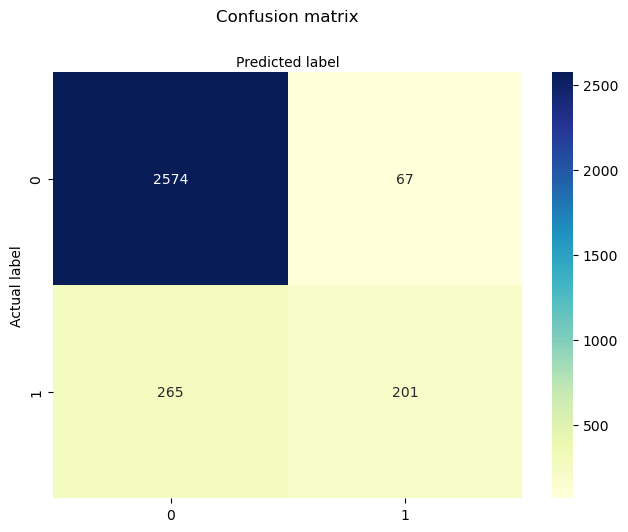

In [40]:
cnf_matrix = metrics.confusion_matrix(YTest, YPred)
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')


## Interpretation of Classification Report for Logistic Regression

The classification report presents various metrics to assess the classifier's performance for both classes (0 and 1) as well as the overall performance.

### Precision:
- Precision is the ratio of true positive predictions to the total predicted positive instances. For class 0, the precision is 0.91, indicating that 91% of the instances predicted as class 0 are actually true negatives.
- For class 1, the precision is 0.75, meaning that 75% of the instances predicted as class 1 are true positives.

### Recall (Sensitivity or True Positive Rate):
- Recall is the ratio of true positive predictions to the total actual positive instances in the dataset. For class 0, the recall is 0.97, indicating that 97% of the actual instances of class 0 are correctly identified as true negatives.
- For class 1, the recall is 0.43, meaning that 43% of the actual instances of class 1 are correctly identified as true positives.

### F1-Score:
- The F1-score is the harmonic mean of precision and recall. It is a balance between precision and recall, providing a single metric to evaluate the classifier's performance. For class 0, the F1-score is 0.94, and for class 1, the F1-score is 0.55.

### Support:
- The "support" column represents the number of occurrences of each class in the test dataset. For class 0, there are 2641 instances, and for class 1, there are 466 instances.

### Accuracy:
- The overall accuracy of the classifier is 89%, indicating the percentage of correctly classified instances out of the total instances in the test dataset.

### Macro Average:
- The "macro avg" row represents the average of the precision, recall, and F1-score across both classes. The macro-average F1-score is 0.74, providing a general assessment of the classifier's performance, considering both classes equally.

### Weighted Average:
- The "weighted avg" row calculates the weighted average of precision, recall, and F1-score based on the support (number of instances) of each class. The weighted-average F1-score is 0.88, indicating the overall performance of the classifier, taking class imbalances into account.

## Summary:
The classifier demonstrates high precision and recall for class 0 (true negatives) but lower precision and recall for class 1 (true positives). The F1-score suggests that the classifier is more effective in correctly classifying instances of class 0 than class 1.

The accuracy of 89% indicates a reasonably good overall performance. However, the lower recall for class 1 suggests that the classifier may struggle to identify instances of class 1 correctly, resulting in a lower F1-score for this class.

To further improve the classifier's performance, one may consider techniques such as hyperparameter tuning, feature engineering, or handling class imbalances using techniques like oversampling or adjusting class weights, or we can reduce the threeshold for the probality of being part of class 1, let's try and see how much differ the results! 

In [41]:
target_names = ['0', '1']
print(classification_report(YTest, YPred, target_names=target_names))

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      2641
           1       0.75      0.43      0.55       466

    accuracy                           0.89      3107
   macro avg       0.83      0.70      0.74      3107
weighted avg       0.88      0.89      0.88      3107



In [42]:
# Predict probabilities for each class in the test set
YPred = logreg.predict_proba(XTest)

# Define your custom threshold value (e.g., 0.5, 0.7, etc.)
custom_threshold = 0.2

# Modify the predictions based on the custom threshold
YPred = (YPred[:, 1] >= custom_threshold).astype(int)

# The custom_YPred contains the final binary predictions based on the custom threshold

print(classification_report(YTest, YPred, target_names=target_names))

              precision    recall  f1-score   support

           0       0.95      0.91      0.93      2641
           1       0.58      0.73      0.64       466

    accuracy                           0.88      3107
   macro avg       0.76      0.82      0.79      3107
weighted avg       0.89      0.88      0.88      3107



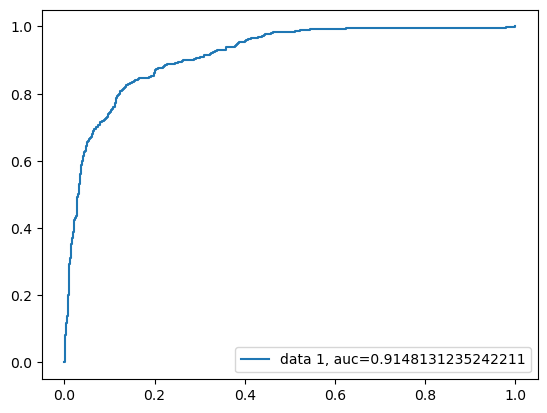

In [43]:
y_pred_proba = logreg.predict_proba(XTest)[::,1]
fpr, tpr, _ = metrics.roc_curve(YTest,  y_pred_proba)
auc = metrics.roc_auc_score(YTest, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

We got better result indeed, but we are not satisfied, so we will implement more complex model! We will now compare the logistic regression with lasso and ridge penalty, let's see if we get better result. In this case we will operate from the beginnin with the modified threeshold.

We will now compare the logistic regression with lasso and ridge penalty, let's see if we get better result. In this case we will operate from the beginnin with the modified threeshold.

## Logistic Regression with L1 and L2 Penalization

### Code Explanation:

1. Two logistic regression models are instantiated: `lr1` and `lr2`. Both models use regularization to prevent overfitting and improve generalization. The `C`, `penalty`, `tol`, and `solver` hyperparameters are set for each model. 
   - `lr1` uses L1 penalty (Lasso) with `C=0.01`, which controls the regularization strength. A lower `C` value means stronger regularization.
   - `lr2` uses L2 penalty (Ridge) with `C=0.01`.
   - The `tol` parameter sets the tolerance for stopping criteria during the optimization process, and the `"saga"` solver is used for faster convergence.

2. The models are fitted to the training data that has been standardized (`XTrain_std` and `YTrain`) using the `fit` method.

3. A custom threshold of `0.2` is set to classify the predicted probabilities as 0 or 1. If the predicted probability of class 1 is greater than or equal to the threshold, the prediction is set to 1; otherwise, it is set to 0. This thresholding step is done for both models to obtain the final binary predictions: `YPred1` for `lr1` and `YPred2` for `lr2`.

4. The code then iterates through each feature name in `X_Feature` (assuming this is a list containing the names of the features).

5. For each feature, the code checks the absolute value of the coefficient obtained from each model.
   - For `lr1`, if the absolute value of the coefficient is exactly 0, it means the coefficient has been shrunk to zero due to L1 penalization (Lasso), and the count of such coefficients is stored in `shrink1`.
   - For `lr2`, if the absolute value of the coefficient is less than or equal to 0.01, it means the coefficient has been shrunk close to zero due to L2 penalization (Ridge), and the count of such coefficients is stored in `shrink2`.

6. The code then prints the number of coefficients that have been shrunk to zero or close to zero for each model.

7. Classification reports are generated using `classification_report` from `sklearn.metrics` for both models to evaluate their performance on the test dataset (`XTest_std` and `YTest`). The reports include metrics such as precision, recall, F1-score, and support for each class (0 and 1).

### Summary:

In summary, the provided code performs the following steps:

- Two logistic regression models, one with L1 penalty (Lasso) and the other with L2 penalty (Ridge), are instantiated and fitted to the standardized training data.
- The models are used to make predictions on the test data, and a custom threshold is applied to convert the predicted probabilities into binary class labels.
- The code evaluates the coefficients of each model to identify the number of coefficients that have been shrunk to zero or close to zero due to L1 or L2 penalization, respectively.
- The classification reports for both models are generated, providing insights into their performance in binary classification, including precision, recall, F1-score, and support metrics.

The L1 and L2 penalization in logistic regression helps prevent overfitting and improve the model's robustness and generalization to unseen data. The classification reports give a detailed assessment of the models' performance, aiding in model selection and tuning.


In [44]:
lr1 = LogisticRegression(C=0.01, penalty='l1', tol=0.01, solver = "saga")
lr2 = LogisticRegression(C=0.01, penalty='l2', tol=0.01, solver = "saga")

shrink1 = 0
shrink2 = 0

lr1.fit(XTrain_std, YTrain)
lr2.fit(XTrain_std, YTrain)

custom_threshold = 0.2

YPred1 = lr1.predict_proba(XTest_std)
YPred1 = (YPred1[:, 1] >= custom_threshold).astype(int)

YPred2 = lr2.predict_proba(XTest_std)
YPred2 = (YPred2[:, 1] >= custom_threshold).astype(int)

print("Coefficients with L1 Penalty:\n")
for idx, col_name in enumerate(X_Feature):
    coef_value = lr1.coef_[0, idx]
    #print("The coefficient for {} is {:0.4f}".format(col_name, coef_value))
    if abs(coef_value) == 0:
        shrink1 += 1

print("\n")
print("Thanks to L1 penalization {} coefficients have been shrinked".format(shrink1))
print("\n")
print("Coefficients with L2 Penalty:")
for idx, col_name in enumerate(X_Feature):
    coef_value = lr2.coef_[0, idx]
    #print("The coefficient for {} is {:0.4f}".format(col_name, coef_value))
    if abs(coef_value) <= 0.01:
        shrink2 += 1

print("\n")
print("Thanks to L2 penalization {} coefficients have been shrinked".format(shrink2))

target_names = ['0', '1']
print("L1:", classification_report(YTest, YPred1, target_names=target_names))
print("L2:", classification_report(YTest, YPred2, target_names=target_names))

Coefficients with L1 Penalty:



Thanks to L1 penalization 46 coefficients have been shrinked


Coefficients with L2 Penalty:


Thanks to L2 penalization 8 coefficients have been shrinked
L1:               precision    recall  f1-score   support

           0       0.95      0.93      0.94      2641
           1       0.66      0.73      0.69       466

    accuracy                           0.90      3107
   macro avg       0.80      0.83      0.82      3107
weighted avg       0.91      0.90      0.90      3107

L2:               precision    recall  f1-score   support

           0       0.96      0.92      0.94      2641
           1       0.61      0.76      0.68       466

    accuracy                           0.89      3107
   macro avg       0.78      0.84      0.81      3107
weighted avg       0.90      0.89      0.90      3107



The Results are similar but the L2 penalization didn't shrink a lot of coefficients, so the resulting model is still a complex model. We will now see if the best subset selection gets better result, but we don't expect to get better, since are still logistic regression models.

In [45]:
import statsmodels.api as sm

def forward_regression_logistic(X, y,
                                initial_list=None,
                                threshold_in=0.01,
                                threshold_out=0.05,
                                verbose=True):
    if initial_list is None:
        initial_list = []

    included = list(initial_list)
    while True:
        changed = False
        # forward step
        excluded = list(set(X.columns) - set(included))
        new_pval = pd.Series(index=excluded, dtype='float64')  # Explicitly set dtype to 'float64'
        for new_column in excluded:
            model = sm.Logit(y, sm.add_constant(pd.DataFrame(X[included + [new_column]]))).fit(disp=False)
            new_pval[new_column] = model.pvalues[new_column]
        best_pval = new_pval.min()
        if best_pval < threshold_in:
            best_feature = new_pval.idxmin()
            included.append(best_feature)
            changed = True
            

        if not changed:
            break

    return included

# Usage example
included_features = forward_regression_logistic(XTrain, YTrain )
print("Selected features:", included_features)

# instantiate the model (using the default parameters) #Full logistic regression
logreg = LogisticRegression(random_state=16, max_iter=10000)

# fit the model with data
logreg.fit(XTrain[included_features], YTrain)

# Predict probabilities for each class in the test set
YPred = logreg.predict_proba(XTest[included_features])

# Define your custom threshold value (e.g., 0.5, 0.7, etc.)
custom_threshold = 0.2

# Modify the predictions based on the custom threshold
YPred = (YPred[:, 1] >= custom_threshold).astype(int)

# The custom_YPred contains the final binary predictions based on the custom threshold
print(classification_report(YTest, YPred, target_names=target_names))

Selected features: ['PageValues', 'Month_Nov', 'ProductRelated', 'ExitRates', 'VisitorType_New_Visitor', 'BounceRates', 'TrafficType_3', 'Month_Jul', 'TrafficType_13', 'ProductRelated_Duration', 'Month_Oct', 'Month_Sep', 'Month_Aug']
              precision    recall  f1-score   support

           0       0.95      0.91      0.93      2641
           1       0.58      0.74      0.65       466

    accuracy                           0.88      3107
   macro avg       0.77      0.82      0.79      3107
weighted avg       0.90      0.88      0.89      3107



In [46]:
import statsmodels.api as sm

def backward_regression_logistic(X, y,
                                initial_list=None,
                                threshold_in=0.05,
                                threshold_out=0.05,
                                verbose=True):
    if initial_list is None:
        included = list(X.columns)
    else:
        included = list(initial_list)

    while True:
        changed = False
        model = sm.Logit(y, sm.add_constant(pd.DataFrame(X[included]))).fit(disp=False)
        # use all coefs except intercept
        pvalues = model.pvalues.iloc[1:]
        worst_pval = pvalues.max()  # null if pvalues is empty
        if worst_pval > threshold_in:
            changed = True
            worst_feature = pvalues.idxmax()
            included.remove(worst_feature)
            
        if not changed:
            break

    return included

included_features_backward = backward_regression_logistic(X_train, y_train)
print("Selected features (backward):", included_features_backward)

# instantiate the model (using the default parameters) #Full logistic regression
logreg = LogisticRegression(random_state=16, max_iter=10000)

# fit the model with data
logreg.fit(XTrain[included_features_backward], YTrain)

# Predict probabilities for each class in the test set
YPred = logreg.predict_proba(XTest[included_features_backward])

# Define your custom threshold value (e.g., 0.5, 0.7, etc.)
custom_threshold = 0.2

# Modify the predictions based on the custom threshold
YPred = (YPred[:, 1] >= custom_threshold).astype(int)

# The custom_YPred contains the final binary predictions based on the custom threshold
print(classification_report(YTest, YPred, target_names=target_names))

Selected features (backward): ['ProductRelated', 'BounceRates', 'VisitorType_New_Visitor']
              precision    recall  f1-score   support

           0       0.88      0.82      0.85      2641
           1       0.26      0.35      0.30       466

    accuracy                           0.75      3107
   macro avg       0.57      0.59      0.57      3107
weighted avg       0.78      0.75      0.76      3107



The forward procedure got results very similar to the others obtained before, using a reduced number of predictors, while backward procedure was a disaster, and this is expected because it's a procedure that has the tendecy of leaving out too much predictors.

# Linear Discriminant Analysis (LDA)

Linear Discriminant Analysis (LDA) is a popular linear classification and dimensionality reduction technique. It is commonly used for solving classification problems with two or more classes. LDA seeks to find a linear combination of features that best separates different classes while reducing the dimensionality of the data.

## Key Concepts of LDA:

1. **Class Separability:** LDA aims to maximize the separability between classes by projecting the data onto a new set of axes. It seeks to find the directions (linear discriminants) that maximize the distance between the means of different classes while minimizing the within-class scatter.

2. **Dimensionality Reduction:** LDA reduces the dimensionality of the data by projecting it onto a lower-dimensional subspace while preserving the class-discriminatory information. The number of discriminant components is limited to the number of classes minus one.

3. **Assumptions:** LDA assumes that the data follows a Gaussian distribution and that the class covariances are equal. When these assumptions are met, LDA can be a powerful classifier.

4. **Decision Rule:** To classify new data points, LDA calculates the discriminant scores for each class and assigns the data point to the class with the highest discriminant score.

## Advantages of LDA:

- LDA performs well in practice even with small training datasets.
- It provides a way to reduce the dimensionality of data while preserving the class-discriminatory information.
- LDA is a supervised learning technique that explicitly takes class labels into account during the analysis.


## Summary:

Linear Discriminant Analysis (LDA) is a versatile technique used for both classification and dimensionality reduction tasks. It seeks to maximize class separability while reducing the number of features. By projecting the data onto discriminant axes, LDA provides a compact representation of the data that is useful for classification problems with multiple classes.


### Code Explanation:

1. The code begins by instantiating a LinearDiscriminantAnalysis (LDA) model as `lda`.

2. The training data (`XTrain_std` and `YTrain`) is transformed using LDA to obtain new feature representations that maximize class separability while reducing dimensionality. The transformed training data is stored in `XTrain_LDA`.

3. Similarly, the test data (`XTest_std`) is transformed using the same LDA model to obtain `XTest_LDA`, which represents the test data in the LDA feature space.

4. Next, the LDA model is used to classify the data. The model is trained on the transformed training data (`XTrain_LDA`) and their corresponding target labels (`YTrain`) using the `fit` method.

5. The code sets a threshold value (`threshold = 0.2`) to classify the predicted probabilities from the LDA model. If the predicted probability of class 1 is greater than the threshold, the prediction is set to 1 (positive class); otherwise, it is set to 0 (negative class).

6. The LDA model is then used to predict the class labels for the transformed test data (`XTest_LDA`). The predicted class labels are stored in `y_pred`.

7. The `classification_report` function from `sklearn.metrics` is used to generate a detailed classification report. The classification report provides metrics such as precision, recall, F1-score, and support for each class (0 and 1). It compares the true class labels (`YTest`) with the predicted class labels (`y_pred`).

### Summary:

In summary, the provided code performs the following steps:

- It applies Linear Discriminant Analysis (LDA) to transform the training and test data into a lower-dimensional space that maximizes class separability.
- The transformed training data is used to train the LDA model, and the transformed test data is used for prediction.
- The LDA model classifies the test data based on the predicted probabilities and a specified threshold.
- The code generates a classification report to evaluate the model's performance on the test dataset, providing insights into precision, recall, F1-score, and support for each class.

The combination of Linear Discriminant Analysis (LDA) for feature transformation and a classification algorithm like Random Forest provides a powerful approach for classification tasks, particularly when dealing with high-dimensional data and multiple classes.


In [47]:
# apply Linear Discriminant Analysis
lda = LinearDiscriminantAnalysis()
XTrain_LDA = lda.fit_transform(XTrain_std, YTrain)
XTest_LDA = lda.transform(XTest_std)


# classify using random forest classifier
lda.fit(XTrain_LDA, YTrain)

threshold = 0.2
y_pred = (lda.predict_proba(XTest_LDA)[:, 1] > threshold).astype('float')

print(classification_report(YTest, y_pred, target_names=target_names))


              precision    recall  f1-score   support

           0       0.94      0.95      0.94      2641
           1       0.69      0.65      0.67       466

    accuracy                           0.90      3107
   macro avg       0.81      0.80      0.81      3107
weighted avg       0.90      0.90      0.90      3107



1. Next, a __RandomForestClassifier__ is instantiated with `classifier`, specifying `max_depth=2` and `random_state=0`. The `max_depth` parameter controls the depth of the decision trees in the random forest, limiting its complexity.

2. The RandomForestClassifier is trained on the transformed training data (`XTrain_LDA`) and their corresponding target labels (`YTrain`) using the `fit` method.

3. The RandomForestClassifier is then used to predict the class labels for the transformed test data (`XTest_LDA`). The predicted class labels are stored in `y_pred`.

By combining Linear Discriminant Analysis (LDA) for feature transformation and a Random Forest classifier, this code demonstrates a powerful approach for classification tasks, particularly when dealing with high-dimensional data and multiple classes.


In [48]:
# apply Linear Discriminant Analysis
lda = LinearDiscriminantAnalysis()
XTrain_LDA = lda.fit_transform(XTrain_std, YTrain)
XTest_LDA = lda.transform(XTest_std)

# classify using random forest classifier
classifier = RandomForestClassifier(max_depth=2, random_state=0)
classifier.fit(XTrain_LDA, YTrain)


threshold = 0.2
y_pred = (classifier.predict_proba(XTest_LDA)[:, 1] > threshold).astype('float')

print(classification_report(YTest, y_pred, target_names=target_names))

              precision    recall  f1-score   support

           0       0.95      0.92      0.93      2641
           1       0.61      0.74      0.67       466

    accuracy                           0.89      3107
   macro avg       0.78      0.83      0.80      3107
weighted avg       0.90      0.89      0.89      3107



Results with the random forest classifier are not bad! Let's see if something change if we not assume that the data have equal mean and covariance for all the classes. In order to take on this, we will use quadratic discriminant analysis.

# Quadratic Discriminant Analysis (QDA)

Quadratic Discriminant Analysis (QDA) is a supervised classification algorithm and an extension of Linear Discriminant Analysis (LDA). Like LDA, QDA is used for solving classification problems with two or more classes. However, unlike LDA, QDA allows for the assumption of different class covariances, making it more flexible when dealing with non-linearly separable data.

## Key Concepts of QDA:

1. **Class Separability:** Similar to LDA, QDA aims to find a linear combination of features that best separates different classes. However, in QDA, each class can have its own covariance matrix, leading to more flexible decision boundaries.

2. **Covariance Matrix:** In QDA, a separate covariance matrix is estimated for each class, capturing the distribution of data within that class. This allows QDA to model class-specific variances and correlations between features.

3. **Decision Rule:** To classify new data points, QDA calculates the posterior probability of each class based on its estimated covariance matrix and assigns the data point to the class with the highest posterior probability.

4. **Assumptions:** QDA assumes that the data within each class follows a multivariate Gaussian distribution.

## Advantages of QDA:

- Flexibility: QDA can capture non-linear relationships between features, making it suitable for data that cannot be separated by linear decision boundaries.
- No Assumption of Equal Covariances: Unlike LDA, QDA does not assume equal class covariances, making it a better choice for data with different variances and correlations across classes.


## Summary:

Quadratic Discriminant Analysis (QDA) is a powerful classification algorithm that generalizes Linear Discriminant Analysis (LDA) by allowing different class covariances. It is particularly useful when dealing with non-linearly separable data and can be applied to various real-world classification problems across different domains.

## Applying Quadratic Discriminant Analysis (QDA) for Classification

### Code Explanation:

1. The code imports the `QuadraticDiscriminantAnalysis` class from `sklearn.discriminant_analysis`.

2. A QDA model is instantiated as `model`.

3. The training data (`XTrain_std` and `YTrain`) is used to train the QDA model using the `fit` method. During training, the model estimates class-specific means and covariance matrices to build the decision boundaries.

4. The code sets a threshold value (`threshold = 0.2`) to classify the predicted probabilities from the QDA model. If the predicted probability of class 1 is greater than the threshold, the prediction is set to 1 (positive class); otherwise, it is set to 0 (negative class).

5. The QDA model is then used to predict the class labels for the test data (`XTest_std`). The predicted class labels are stored in `y_pred`.

6. The `classification_report` function from `sklearn.metrics` is used to generate a detailed classification report. The classification report provides metrics such as precision, recall, F1-score, and support for each class (0 and 1). It compares the true class labels (`YTest`) with the predicted class labels (`y_pred`).

### Summary:

In summary, the provided code performs the following steps:

- It applies Quadratic Discriminant Analysis (QDA) to build a classification model based on the training data.
- The QDA model is used to predict the class labels for the test data.
- A threshold is set to classify the predicted probabilities as 0 or 1, producing the final binary class predictions.
- The code generates a classification report to evaluate the QDA model's performance on the test dataset. The classification report provides insights into precision, recall, F1-score, and support for each class.


In [49]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis 
model = QuadraticDiscriminantAnalysis()
model.fit(XTrain_std, YTrain)

threshold = 0.2
y_pred = (model.predict_proba(XTest_std)[:, 1] > threshold).astype('float')

print(classification_report(YTest, y_pred, target_names=target_names))

              precision    recall  f1-score   support

           0       0.95      0.56      0.70      2641
           1       0.25      0.84      0.39       466

    accuracy                           0.60      3107
   macro avg       0.60      0.70      0.55      3107
weighted avg       0.85      0.60      0.66      3107



C:\Users\Marco\anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


The QDA got a warning for collinearity. 
Principal Component Analysis (PCA) is a dimensionality reduction technique that can indirectly help with reducing collinearity between features. Let's try using PCA on our data and run QDA.

## Applying Quadratic Discriminant Analysis (QDA) with PCA for Dimensionality Reduction

### Code Explanation:

1. A new QDA model is instantiated as `model`.

2. Principal Component Analysis (PCA) is applied to the training data (`XTrain`) using `PCA(n_components=5)`. The `n_components` parameter specifies the number of principal components to be retained after dimensionality reduction. The transformed training data is stored in `X_pca`.

3. Similarly, PCA is applied to the test data (`XTest`) using the same PCA model to obtain `X_pca_test`, which represents the test data in the reduced feature space.

4. The QDA model is then trained on the transformed training data (`X_pca`) and their corresponding target labels (`YTrain`) using the `fit` method.

5. A threshold value (`threshold = 0.2`) is set to classify the predicted probabilities from the QDA model. If the predicted probability of class 1 is greater than the threshold, the prediction is set to 1 (positive class); otherwise, it is set to 0 (negative class).

6. The QDA model is used to predict the class labels for the transformed test data (`X_pca_test`). The predicted class labels are stored in `y_pred`.

7. The `classification_report` function from `sklearn.metrics` is used to generate a detailed classification report. The classification report provides metrics such as precision, recall, F1-score, and support for each class (0 and 1). It compares the true class labels (`YTest`) with the predicted class labels (`y_pred`).

### Summary:

In summary, the new code extends the application of Quadratic Discriminant Analysis (QDA) to perform dimensionality reduction using Principal Component Analysis (PCA) on the training and test data. The reduced feature space obtained from PCA is then used for training the QDA model and making predictions. The classification report evaluates the performance of the QDA model on the test dataset, providing insights into precision, recall, F1-score, and support for each class.

By using PCA for dimensionality reduction before applying QDA, this code effectively reduces the complexity of the data while preserving essential information for classification, which can be beneficial for improving the model's efficiency and performance.

In [50]:
model = QuadraticDiscriminantAnalysis()

# Apply PCA for dimensionality reduction
pca = PCA(n_components=5)
X_pca = pca.fit_transform(XTrain)
X_pca_test = pca.fit_transform(XTest)

model.fit(X_pca, YTrain)

threshold = 0.2
y_pred = (model.predict_proba(X_pca_test)[:, 1] > threshold).astype('float')

print(classification_report(YTest, y_pred, target_names=target_names))

              precision    recall  f1-score   support

           0       0.93      0.92      0.93      2641
           1       0.58      0.62      0.60       466

    accuracy                           0.88      3107
   macro avg       0.76      0.77      0.76      3107
weighted avg       0.88      0.88      0.88      3107



We didn't get good result, and we didn't find a model with very good performance, so maybe it's time to switch to other type of models, more complex, but maybe more powerful on this particular data. Let's see K-Nearest Neighbours.

# K-Nearest Neighbors (KNN)

K-Nearest Neighbors (KNN) is a simple and versatile classification algorithm used for both classification and regression tasks. In the context of classification, KNN is a non-parametric and instance-based learning algorithm. It makes predictions based on the majority class of the 'k' nearest data points to a new data point.

## Key Concepts of KNN:

1. **K Neighbors:** KNN derives its name from the number 'k', which represents the number of nearest neighbors to consider when making predictions. The value of 'k' is a hyperparameter, and a small 'k' can lead to noisy predictions, while a large 'k' can lead to over-smoothed decisions.

2. **Distance Metric:** KNN uses a distance metric, such as Euclidean distance, to measure the similarity between data points. The choice of distance metric affects how neighboring points are identified.

3. **Voting Scheme:** When predicting the class of a new data point, KNN considers the class labels of its 'k' nearest neighbors. The class that appears the most among the neighbors is assigned to the new data point.

## Advantages of KNN:

- Simple and Intuitive: KNN is easy to understand and implement, making it a popular choice for beginners.
- No Training Phase: KNN does not involve a training phase and directly uses the entire training dataset for predictions.
- Versatility: KNN can handle multi-class classification problems and is also applicable to regression tasks.


## Summary:

K-Nearest Neighbors (KNN) is a simple yet powerful classification algorithm that makes predictions based on the majority class of the 'k' nearest data points. It is non-parametric, intuitive, and versatile, making it a valuable tool in various classification and regression tasks. However, KNN's performance can be sensitive to the choice of 'k' and the distance metric, and it may require data preprocessing to handle different scales and dimensions of features.

## Applying K-Nearest Neighbors (KNN) for Classification

### Code Explanation:

1. The code first converts the training and test datasets (`XTrain_std` and `XTest_std`) to NumPy arrays using the `to_numpy()` method. This conversion is done to prepare the data for further processing.

2. Next, a `StandardScaler` instance is created as `scaler`. The `StandardScaler` is fitted on the training data `XTrainKNN` using the `fit_transform()` method. This step standardizes the features in the training data, ensuring that they have zero mean and unit variance.

3. The same `StandardScaler` instance (`scaler`) is then applied to the test data `XTestKNN` using the `fit_transform()` method. This ensures that the test data is standardized using the same scaling parameters as the training data.

4. A K-Nearest Neighbors classifier is instantiated as `knn` with `n_neighbors=3`, indicating that the algorithm will consider the three nearest neighbors for making predictions.

5. The `knn` classifier is trained on the standardized training data (`XTrainKNN`) and their corresponding target labels (`YTrain`) using the `fit` method.

In [51]:
XTrainKNN = XTrain_std.to_numpy()
XTestKNN = XTest_std.to_numpy()

scaler = StandardScaler()
XTrainKNN = scaler.fit_transform(XTrainKNN)
XTestKNN = scaler.fit_transform(XTestKNN)


knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(XTrainKNN, YTrain)
y_pred = knn.predict(XTestKNN)

print(classification_report(YTest, y_pred, target_names=target_names))

              precision    recall  f1-score   support

           0       0.88      0.96      0.92      2641
           1       0.54      0.25      0.34       466

    accuracy                           0.86      3107
   macro avg       0.71      0.61      0.63      3107
weighted avg       0.83      0.86      0.83      3107



6. A threshold value (`threshold = 0.2`) is set to classify the predicted probabilities from the KNN classifier. If the predicted probability of class 1 is greater than the threshold, the prediction is set to 1 (positive class); otherwise, it is set to 0 (negative class).

7. The KNN classifier is used to predict the class labels for the standardized test data (`XTestKNN`). The predicted class labels are stored in `y_pred`.

8. The `classification_report` function from `sklearn.metrics` is used to generate a detailed classification report. The classification report provides metrics such as precision, recall, F1-score, and support for each class (0 and 1). It compares the true class labels (`YTest`) with the predicted class labels (`y_pred`).

### Summary:

In summary, the provided code performs the following steps:

- It standardizes the features of the training and test datasets using `StandardScaler`.
- A K-Nearest Neighbors (KNN) classifier with `n_neighbors=3` is instantiated and trained on the standardized training data.
- The classifier is used to predict the class labels for the standardized test data.
- A threshold is set to classify the predicted probabilities as 0 or 1, producing the final binary class predictions.
- The code generates a classification report to evaluate the KNN classifier's performance on the test dataset. The classification report provides insights into precision, recall, F1-score, and support for each class.

In [52]:
XTrainKNN = XTrain_std.to_numpy()
XTestKNN = XTest_std.to_numpy()

scaler = StandardScaler()
XTrainKNN = scaler.fit_transform(XTrainKNN)
XTestKNN = scaler.fit_transform(XTestKNN)


knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(XTrainKNN, YTrain)

threshold = 0.2
y_pred = (knn.predict_proba(XTestKNN)[:, 1] > threshold).astype('float')

print(classification_report(YTest, y_pred, target_names=target_names))

              precision    recall  f1-score   support

           0       0.91      0.75      0.82      2641
           1       0.29      0.60      0.39       466

    accuracy                           0.72      3107
   macro avg       0.60      0.67      0.61      3107
weighted avg       0.82      0.72      0.76      3107



## Applying K-Nearest Neighbors (KNN) for Classification with Feature Selection

### Code Explanation:

The code selects only the included features (`included_features`) from the standardized training data (`XTrain_std`) and test data (`XTest_std`) using indexing. The selected features are then converted to NumPy arrays `XTrainKNN2` and `XTestKNN2`.

### Summary:

In summary, the updated code applies K-Nearest Neighbors (KNN) for classification after performing feature selection using the `included_features`. It selects only the relevant features from the standardized data to train the classifier, which can help reduce noise and improve the model's efficiency. The performance of the KNN classifier is then evaluated using the classification report on the test dataset with the selected features.

By using feature selection before applying KNN, this code can potentially improve the model's predictive power and make it more robust to irrelevant or redundant features.


In [53]:
#with feature sel
XTrainKNN2 = XTrain_std[included_features].to_numpy()
XTestKNN2 = XTest_std[included_features].to_numpy()

scaler = StandardScaler()
XTrainKNN2 = scaler.fit_transform(XTrainKNN2)
XTestKNN2 = scaler.fit_transform(XTestKNN2)

knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(XTrainKNN2, YTrain)

threshold = 0.2
y_pred = (knn.predict_proba(XTestKNN2)[:, 1] > threshold).astype('float')

print(classification_report(YTest, y_pred, target_names=target_names))

              precision    recall  f1-score   support

           0       0.96      0.85      0.90      2641
           1       0.48      0.81      0.60       466

    accuracy                           0.84      3107
   macro avg       0.72      0.83      0.75      3107
weighted avg       0.89      0.84      0.86      3107



## Hyperparameter Tuning for K-Nearest Neighbors (KNN) and Classification

### Code Explanation:

1. The code creates a list `k_values` containing values from 1 to 30 (inclusive) to be considered as the number of neighbors ('k') for KNN.

2. The code iterates through each value of 'k' in `k_values`, and for each 'k', it performs KNN using cross-validation with 5 folds. The mean accuracy score of each cross-validation is calculated and stored in the `scores` list.

3. A line plot is created using Seaborn (`sns.lineplot`) to visualize the relationship between different 'k' values and their corresponding mean accuracy scores.

4. The index of the maximum accuracy score in `scores` is determined using `np.argmax(scores)`, and the corresponding 'k' value is stored in `best_k`.

5. A KNN classifier is then instantiated with `best_k` as the number of neighbors and trained on the selected features of the standardized training data (`XTrainKNN2`) and their corresponding target labels (`YTrain`).

### Summary:

In summary, the updated code performs hyperparameter tuning for K-Nearest Neighbors (KNN) by evaluating different values of 'k' using cross-validation. It identifies the best 'k' value that yields the highest mean accuracy score. Afterward, the code applies KNN with the best 'k' value for classification on the test data, using the selected features obtained through feature selection.

Hyperparameter tuning helps find the optimal value of 'k', which can significantly impact the performance of the KNN classifier. By using the best 'k' value, the model can be better suited to the data, resulting in improved accuracy in predicting the target classes.

By executing this updated code in a Jupyter Notebook, you can visualize the accuracy scores for different 'k' values and apply the optimized KNN classifier for classification, obtaining the classification report to evaluate the model's performance on the test dataset.


In [54]:
k_values = [i for i in range (1,31)]
scores = []

XKNN = X.to_numpy()

scaler = StandardScaler()
XKNN = scaler.fit_transform(XKNN)

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    score = cross_val_score(knn, XKNN, Y, cv=5)
    scores.append(np.mean(score))

Text(0, 0.5, 'Accuracy Score')

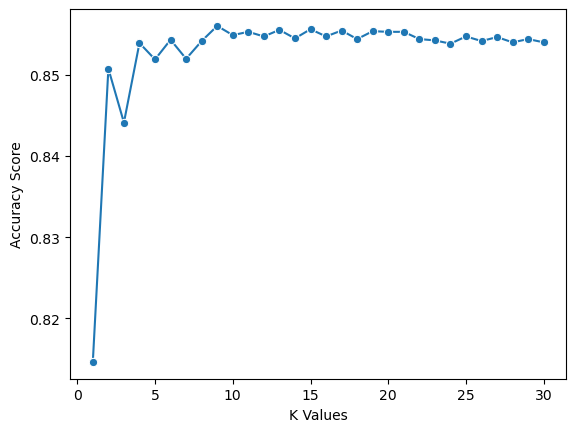

In [55]:
sns.lineplot(x = k_values, y = scores, marker = 'o')
plt.xlabel("K Values")
plt.ylabel("Accuracy Score")

In [56]:
best_index = np.argmax(scores)
best_k = k_values[best_index]

knn = KNeighborsClassifier(n_neighbors=best_k)
knn.fit(XTrainKNN2, YTrain)

KNeighborsClassifier(n_neighbors=9)

In [57]:
threshold = 0.2
y_pred = (knn.predict_proba(XTestKNN2)[:, 1] > threshold).astype('float')

print(classification_report(YTest, y_pred, target_names=target_names))

              precision    recall  f1-score   support

           0       0.96      0.84      0.90      2641
           1       0.48      0.82      0.61       466

    accuracy                           0.84      3107
   macro avg       0.72      0.83      0.75      3107
weighted avg       0.89      0.84      0.86      3107



Now, we obtained __very good recall scores__, let's see if with a more complex model we can get better result. 

# Support Vector Classifier (SVC)

Support Vector Classifier (SVC) is a powerful and versatile classification algorithm used for binary and multi-class classification tasks. It is a type of Support Vector Machine (SVM) algorithm that constructs hyperplanes in a high-dimensional space to separate different classes of data points.

## Key Concepts of SVC:

1. **Hyperplanes:** In SVC, the algorithm aims to find an optimal hyperplane that best separates the data points of different classes. For binary classification, SVC searches for a hyperplane that maximizes the margin between the two classes, known as the "maximum margin hyperplane."

2. **Kernel Trick:** SVC can handle non-linearly separable data by using the kernel trick. The kernel function transforms the data into a higher-dimensional space, allowing SVC to find a hyperplane that separates the classes even in a higher-dimensional feature space.

3. **Support Vectors:** Support vectors are the data points closest to the hyperplane and play a crucial role in defining the decision boundary. They determine the margin and the overall performance of the classifier.

## Advantages of SVC:

- Effective in High-Dimensional Spaces: SVC works well in high-dimensional feature spaces, making it suitable for complex datasets with many features.

- Robust to Outliers: The use of support vectors makes SVC robust to outliers, as it focuses on the most critical data points for decision-making.

- Versatility: SVC can handle both linearly and non-linearly separable data through the use of different kernel functions.


## Summary:

Support Vector Classifier (SVC) is a powerful classification algorithm that separates data points by constructing hyperplanes in a high-dimensional feature space. It can handle both linearly and non-linearly separable data and is robust to outliers. SVC's ability to work effectively in high-dimensional spaces makes it suitable for various real-world classification tasks.

## Applying Support Vector Classifier (SVC) for Binary Classification

### Code Explanation:

1. The code creates an SVC classifier `clf` with a linear kernel (`kernel='linear'`). The `probability` parameter is set to `True`, enabling the probability estimates for class membership.

2. The SVC classifier is trained on the standardized training data (`XTrain_std`) and their corresponding target labels (`YTrain`) using the `fit` method.

3. The classifier is used to predict the class labels for the standardized test data (`XTest_std`). The predicted class labels are stored in `y_pred`.

4. The `classification_report` function from `sklearn.metrics` is used to generate a detailed classification report. The classification report provides metrics such as precision, recall, F1-score, and support for each class (0 and 1). It compares the true class labels (`YTest`) with the predicted class labels (`y_pred`).

5. A threshold value (`threshold = 0.1`) is set to classify the predicted probabilities from the SVC classifier. If the predicted probability of class 1 is greater than the threshold, the prediction is set to 1 (positive class); otherwise, it is set to 0 (negative class).

6. The SVC classifier is again used to predict the class labels for the standardized test data (`XTest_std`) with probability estimates enabled. The predicted probabilities for class 1 are extracted using the `predict_proba` method and thresholded based on the specified threshold.

7. Another `classification_report` is generated for the thresholded predictions. This report provides insights into the classifier's performance when using the probability estimates and a threshold for classification.

### Summary:

The provided code applies the Support Vector Classifier (SVC) with a linear kernel for binary classification. It trains the classifier on the standardized training data, predicts class labels for the test data, and evaluates its performance using the classification report. Additionally, the code demonstrates how to use probability estimates to apply a threshold for classification, enabling a more flexible classification strategy.

The classification report provides a comprehensive overview of the classifier's performance, including metrics for precision, recall, F1-score, and support for both classes. By applying different threshold values, one can adjust the classification threshold and explore how it affects the classifier's performance and the trade-off between precision and recall.

In [58]:
from sklearn.svm import SVC  
clf = SVC(kernel='linear', probability=True) 
  
# fitting x samples and y classes 
clf.fit(XTrain_std, YTrain) 

y_pred = clf.predict(XTest_std)
print(classification_report(YTest, y_pred, target_names=target_names))


              precision    recall  f1-score   support

           0       0.91      0.98      0.94      2641
           1       0.79      0.46      0.58       466

    accuracy                           0.90      3107
   macro avg       0.85      0.72      0.76      3107
weighted avg       0.89      0.90      0.89      3107



In [59]:
threshold = 0.1
y_pred = (clf.predict_proba(XTest_std)[:, 1] > threshold).astype('float')

print(classification_report(YTest, y_pred, target_names=target_names))

              precision    recall  f1-score   support

           0       0.97      0.87      0.92      2641
           1       0.54      0.84      0.66       466

    accuracy                           0.87      3107
   macro avg       0.76      0.86      0.79      3107
weighted avg       0.90      0.87      0.88      3107



Overall, the classifier demonstrates high precision for class 0 (true negatives) but lower precision for class 1 (true positives). It shows good recall for both classes,which is what we look at most, with a slightly higher recall for class 1. The F1-score suggests that the classifier is more effective in correctly classifying instances of class 0 than class 1. The accuracy of 87% indicates a reasonably good overall performance, but the class imbalance may affect the classifier's effectiveness for class 1.

In [82]:
YTestN = YTest.to_numpy()

In [86]:
YProb[:,1]

array([0.06324218, 0.06837715, 0.04215843, ..., 0.12320832, 0.14550505,
       0.10728148])

# Point 3: Clustering

## Clustering for Classification

Clustering is a technique used in classification to group similar data points together based on their similarities or distances in a feature space. The main goal of clustering is to identify natural patterns or structures within the data, where data points within the same cluster are more similar to each other compared to those in different clusters.

In the context of classification, clustering can serve as a pre-processing step to gain insights into the data and potentially improve the performance of classification models. By clustering similar data points together, it becomes easier to identify the underlying patterns and relationships within different groups or classes, which can aid in feature selection and model building.

Once the clusters are identified, classification models can be applied within each cluster to make more accurate predictions, as the data points within each cluster are expected to be more homogeneous. This approach can be particularly useful when dealing with complex datasets that exhibit different patterns within distinct groups.

Overall, clustering for classification is a valuable technique to enhance the understanding of data, improve feature selection, and potentially boost the performance of classification models by exploiting the natural grouping of data points.


For this step we don't need a split into X and Y but we will use a single data, and see the clusters inside the data!

## PCA for Clustering

Principal Component Analysis (PCA) is a dimensionality reduction technique commonly used in clustering to transform high-dimensional data into a lower-dimensional space. The main goal of PCA is to identify the principal components, which are new orthogonal axes that capture the maximum variance in the data.

In the context of clustering, PCA can be employed as a pre-processing step to reduce the dimensionality of the feature space. By reducing the number of dimensions, PCA helps to simplify the data representation while retaining the most important information and patterns. This can be especially beneficial when working with datasets that have a large number of features, as it reduces computational complexity and can improve clustering performance.

After applying PCA, clustering algorithms can be applied to the transformed data in the reduced feature space. Clustering on the principal components can potentially lead to better-defined clusters, as the reduced dimensions focus on the directions of maximum variance and highlight the most significant patterns in the data.

Furthermore, PCA can aid in data visualization, as it projects the data onto a lower-dimensional plane, making it easier to visualize and interpret the cluster structures. This enables data analysts and researchers to gain valuable insights into the clustering results.

It's important to note that while PCA can be advantageous for clustering, it is not always necessary or suitable for every dataset. The decision to use PCA for clustering should be based on the specific characteristics of the data and the goals of the clustering analysis.

In summary, PCA for clustering offers a way to reduce the dimensionality of high-dimensional data, simplify data representation, improve clustering performance, and facilitate data visualization for a more insightful and effective clustering analysis.

### Explanation of the Code
The provided code performs Principal Component Analysis (PCA) on a given dataset and then creates a 3D scatter plot to visualize the data points in reduced dimensions.

1. First, PCA is applied to the entire dataset to reduce its dimensionality. The code computes the cumulative explained variance ratio for each principal component and plots it against the number of components. This helps us understand how much information is preserved as we increase the number of principal components.

2. Next, a function plot3d(X, labels) is defined to create a 3D scatter plot. The function takes two main arguments:
    `X`: A matrix containing the data points after PCA transformation.
    `labels`: An array containing the cluster assignments or labels for each data point.
    
3. Finally, PCA is applied to the training set (`XTrain`) and test set (`XTest`) using `PCA(n_components=5)` to reduce their dimensions to 5 principal components. 5 is selected by seeing the graph for variance ratio in point 1.

4. The transformed data points (XTrainPCA and XTestPCA) are then plotted in 3D space using the plot3d function, with cluster assignments provided by the Y array.

This code helps to visualize how well the data is separated into different clusters after applying PCA and reducing the dimensionality to 3D. It provides insights into the data's structure and cluster distribution in a lower-dimensional space, making it easier to interpret and analyze complex datasets.

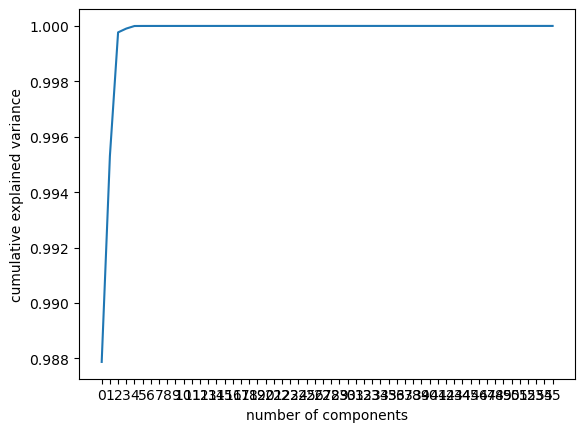

In [127]:
pca = PCA().fit(dataP)
explained_variance_ratio_cumulative = np.cumsum(pca.explained_variance_ratio_)

plt.plot(explained_variance_ratio_cumulative)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

# Set xticks to show every value
plt.xticks(np.arange(0, len(explained_variance_ratio_cumulative), 1))

plt.show()


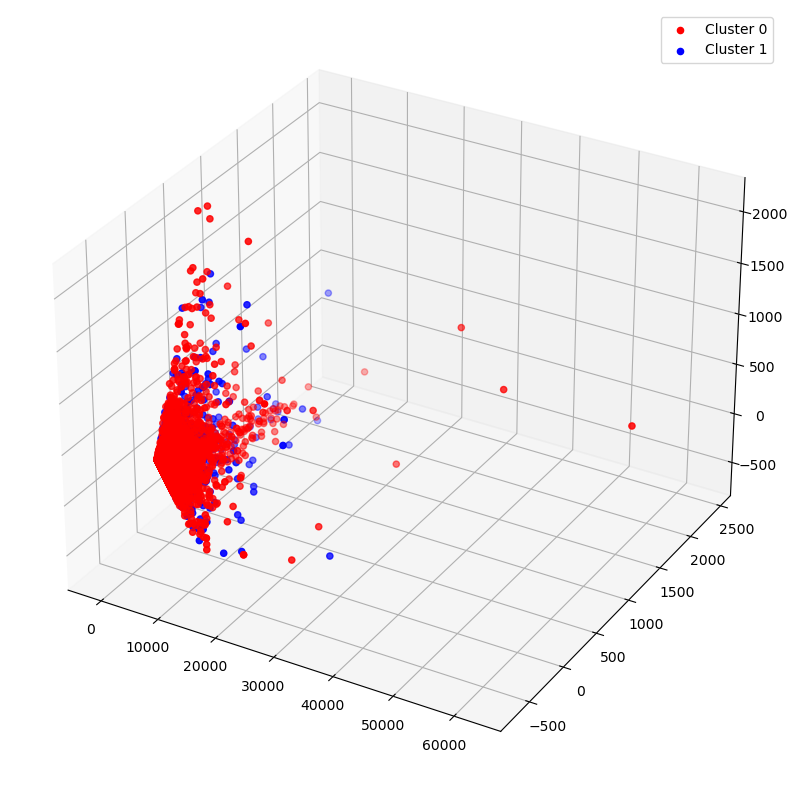

In [129]:
pca = PCA(n_components=5)

X_pca = pca.fit_transform(dataP)
XTrainPCA = pca.fit_transform(XTrain)
XTestPCA = pca.fit_transform(XTest)

def plot3d(X, labels):
    from mpl_toolkits.mplot3d import Axes3D

    unique_labels = np.unique(labels)
    nlabels = len(unique_labels)

    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Define colors for the two clusters (red and blue)
    colors = ['red', 'blue']

    # Plot the 3d coordinates with colors for each cluster
    for i in range(nlabels):
        cluster_mask = labels == unique_labels[i]
        ax.scatter(xs=X[cluster_mask, 0], ys=X[cluster_mask, 1], zs=X[cluster_mask, 2], c=colors[i], label=f'Cluster {unique_labels[i]}')

    # Add a legend to the plot
    ax.legend()

plot3d(X_pca, labels=Y)


# Agglomerative Clustering 

Agglomerative Clustering is a hierarchical clustering algorithm used for grouping similar data points into clusters. In this algorithm, each data point starts as its own cluster, and then clusters are iteratively merged together based on their similarity until a stopping criterion is met. The result is a tree-like structure called a dendrogram, which can be further cut at different levels to form clusters.

## Algorithm Steps:
1. __Initialization__: Start with each data point as an individual cluster.

2. __Distance Calculation__: Compute the pairwise distance (similarity) between all clusters. The distance between clusters can be measured using various metrics, such as Euclidean distance or cosine similarity, depending on the nature of the data.

3. __Merge Clusters__: Identify the two closest clusters based on the calculated distances and merge them into a single cluster.

4. __Update Distance Matrix__: Recalculate the distance between the newly formed cluster and all the remaining clusters.

5. __Repeat:__ Continue the process of merging the closest clusters and updating the distance matrix until a termination condition is met.

6. __Termination__: The algorithm stops when a specific number of clusters are obtained, or when a predefined distance threshold is reached.

## Dendrogram and Cluster Selection:
Agglomerative Clustering creates a dendrogram, which is a hierarchical representation of the merging process. The dendrogram illustrates the order in which clusters are merged and the corresponding distances at which these merges occur.

To obtain a specific number of clusters, one can cut the dendrogram at a desired distance threshold. Alternatively, the algorithm can be stopped after a certain number of iterations to get a pre-defined number of clusters.

### Advantages:
- __Flexibility__: Agglomerative Clustering can handle different types of distance metrics and linkage methods, allowing customization based on the specific problem at hand.

- __Visual Interpretation__: The dendrogram provides a visual representation of the clustering process, which can help in understanding the hierarchical structure and choosing an appropriate number of clusters.

- __No Predefined Number of Clusters__: Unlike some other clustering algorithms, Agglomerative Clustering does not require specifying the number of clusters beforehand, making it more flexible in certain situations.

### Limitations:
- __Computationally Expensive__: Agglomerative Clustering can be computationally expensive, especially on large datasets, as it involves calculating the distance matrix at each iteration.

- __Sensitivity to Noise__: Agglomerative Clustering is sensitive to noise and outliers, which can lead to suboptimal clustering results.

- __Difficulty Handling Large Datasets__: The memory and time complexity of the algorithm can make it challenging to apply to very large datasets.

Agglomerative Clustering is a powerful technique for clustering data points into groups based on their similarity, providing valuable insights and aiding decision-making processes in various applications. However, its performance and suitability depend on the specific characteristics of the dataset and the problem at hand.

C:\Users\Marco\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


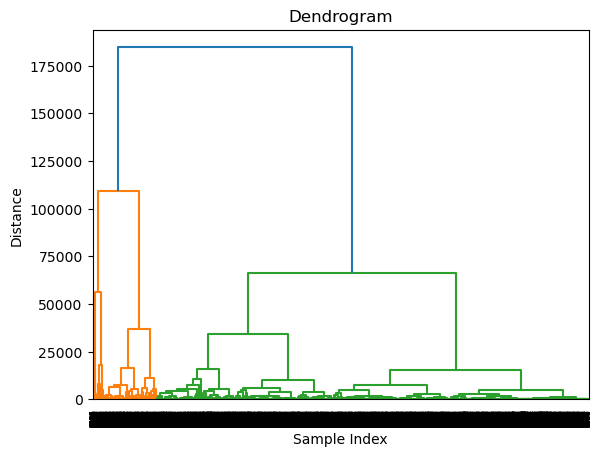

In [132]:
# Perform Agglomerative Clustering
clusters = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
cluster_labels = clusters.fit_predict(XTrainPCA)

# Plot the Dendrogram
dendrogram(linkage(XTrainPCA, 'ward'),
            orientation='top',
            distance_sort='descending',
            show_leaf_counts=True)

plt.title("Dendrogram")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

In [134]:
y_pred = clusters.fit_predict(XTrainPCA)
y_test_pred = clusters.fit_predict(XTestPCA) 

C:\Users\Marco\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\Marco\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [135]:
    print("Hierarchical Clustering with {} Linkage".format(linkage))
    print("Accuracy in Training: {:.5}".format(accuracy_score(YTrain, y_pred)))
    print("Accuracy in Testing:  {:.5}".format(accuracy_score(YTest, y_test_pred)))
    print("Recall in Training: {:.5}".format(recall_score(YTrain, y_pred)))
    print("Recall in Testing:  {:.5}".format(recall_score(YTest, y_test_pred)))
    print("Jaccard Index in Training: {:.5}".format(jaccard_score(YTrain, y_pred)))
    print("Jaccard Index in Testing:  {:.5}".format(jaccard_score(YTest, y_test_pred)))


Hierarchical Clustering with <function linkage at 0x000001C805B3BC10> Linkage
Accuracy in Training: 0.21442
Accuracy in Testing:  0.16318
Recall in Training: 0.77516
Recall in Testing:  0.90773
Jaccard Index in Training: 0.13326
Jaccard Index in Testing:  0.13993



Both the training and testing accuracies are quite low, which suggests that the model's performance is poor. But as we see the recall, we see very good results. The reason behind this is probably the class inbalance in the data, we have a lot of negative revenue which the model failed to classify, while the positive revenues has been recognized. This is a really strange behaviour also respect to classification models, which where at the beginnin more capable of detecting negative revenues. The Jaccard Index, also known as the Jaccard similarity coefficient, measures the similarity between two sets. In this context, it likely represents how similar the predicted clusters are to the true clusters. The values are relatively low, indicating that the predicted clusters do not align well with the true clusters.

Overall, the results suggest that the model may be overfitting the training data, as evidenced by the higher recall in testing compared to training. The low accuracy and Jaccard Index further support this conclusion, indicating that the model's clusters are not accurately representing the true clusters in the data.

# K-Nearest Neighbors (KNN) 
The K-Nearest Neighbors (KNN) algorithm is a simple and widely used classification and regression algorithm in machine learning. It is a non-parametric and lazy learning algorithm, which means it doesn't make any assumptions about the underlying data distribution during training and doesn't learn an explicit model. Instead, it stores all the training data points in memory and makes predictions based on the k-nearest neighbors to a given query point.

KMeans is a representative-based clustering algorithm, meaning that, each cluster is always represented by a single point in the feature space. It is an **iterative** algorithm, that incrementally updates and improve the solution, and, unlike hierarchical clustering, it **needs to know in advantage the final number of clusters**.

## Algorithm Steps:

1. **Input**: The KNN algorithm takes in labeled training data and a new data point (query point) that we want to classify or predict.

2. **Distance Metric**: A distance metric (e.g., Euclidean distance) is used to measure the similarity between the query point and all the training data points.

3. **Finding Neighbors**: The algorithm identifies the k-nearest neighbors to the query point based on the calculated distance.

4. **Classification (for KNN Classifier)**: For classification tasks, the majority class among the k-nearest neighbors is assigned as the predicted class for the query point.

5. **Regression (for KNN Regressor)**: For regression tasks, the predicted value for the query point is the average (or weighted average) of the target values of its k-nearest neighbors.

### Choosing the Value of K:
The choice of k is a crucial hyperparameter in the KNN algorithm. A small value of k can lead to a noisy decision boundary and be sensitive to outliers, while a large value of k can lead to a smoothing effect and potentially misclassify points in regions with mixed classes.

The optimal value of k depends on the data distribution and the problem at hand. It is often determined through techniques like cross-validation, where different values of k are evaluated based on their performance on validation data.

### Advantages:
- **Simplicity**: KNN is easy to understand and implement, making it a good starting point for various machine learning tasks.

- **Non-Parametric**: As a non-parametric algorithm, KNN can handle complex data distributions without making assumptions about their shape.

- **No Training Phase**: KNN doesn't have a traditional training phase, so the prediction phase is relatively fast and inexpensive.

### Limitations:

- **:Computationally Expensive**:: KNN can be computationally expensive, especially for large datasets, as it requires calculating distances to all training points for each query point.

- **:Sensitive to Data Representation**: The performance of KNN heavily depends on the choice of distance metric and the way features are represented.

- **:Imbalanced Data**: KNN tends to favor classes with more samples in the neighborhood, making it less effective for imbalanced datasets.

K-Nearest Neighbors (KNN) is a versatile and intuitive algorithm that can be applied to both classification and regression tasks. Its simplicity and effectiveness make it a popular choice in various machine learning applications, but users need to carefully consider the value of k and data representation to achieve optimal results for their specific problems.

C:\Users\Marco\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


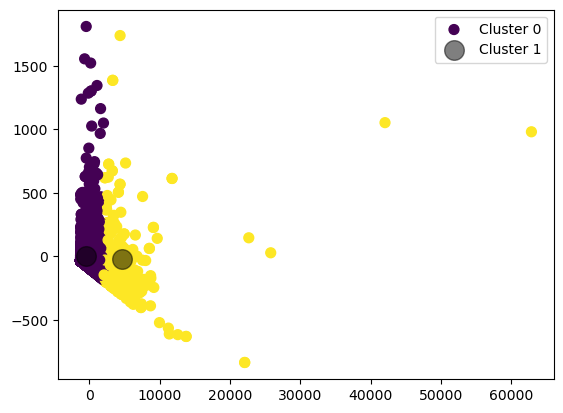

Accuracy in Testing:  0.81493
Recall in Testing:  0.16738
Jaccard Index in Testing:  0.11945


In [137]:
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(XTrainPCA)
y_kmeans = kmeans.predict(XTestPCA)

plt.scatter(XTestPCA[:, 0], XTestPCA[:, 1], c=y_kmeans, s=50, cmap='viridis')

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)

# Create custom legend labels for each cluster
unique_labels = np.unique(y_kmeans)
legend_labels = ['Cluster {}'.format(label) for label in unique_labels]

plt.legend(legend_labels)
plt.show()

print("Accuracy in Testing:  {:.5}".format(accuracy_score(YTest, y_kmeans)))
print("Recall in Testing:  {:.5}".format(recall_score(YTest, y_kmeans)))
print("Jaccard Index in Testing:  {:.5}".format(jaccard_score(YTest, y_kmeans)))
    

In this case we have the opposite situation, similar to the classification models without threeshold correction. The clustering identify in a good way the negative revenues but fails with the positive revenues.